<div style="text-align: right"><b>Daniel ADDAI-MARNU</b></div>

# <center>Distribution Patterns and Price Determinants of Airbnb Listings: A New York City Case Study</center>

## Libraries and Data

### Importing Libraries

In [1]:
# To get matplotlib inline:
%matplotlib inline

# Import usual libraries:
from os import path
import warnings
warnings.filterwarnings('ignore')

# Import Data Manipulation Libraries:
import numpy as np
import pandas as pd

# Import Visualisation Libraries:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from matplotlib import rcParams
from matplotlib.colors import ListedColormap
import matplotlib.gridspec as gridspec

# Import Spatial Visualisation Libraries:
import geopandas as gpd
import fiona
import folium
import folium.plugins
import plotly.express as pt

# Import WordCloud Libraries:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# Import Modelling Libraries:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
import xgboost as xgb
from xgboost import plot_importance
from sklearn.ensemble import RandomForestRegressor
import time

# Customize Seaborn and Matplotlib Parameters:
mpl.rcParams['figure.dpi']= 300
sns.set()
rc = {'axes.facecolor': 'white',
      'axes.edgecolor': 'black',
      'font.family': ['serif'], 
      'grid.color': 'gainsboro',
      'grid.linestyle': '-', 
      'patch.edgecolor': 'none'
      }
sns.set_style(rc=rc)
sns.set_context("notebook", font_scale=0.8)
mpl.rcParams['figure.edgecolor']= 'black'
mpl.rcParams['axes.linewidth']= 0.5

###  Loading And Inspecting Data

In [2]:
# Load data:
airbnb = pd.read_csv('listings.csv') # Airbnb data
interest = gpd.read_file('Areas of Interest GIS.geojson') # Places of interest in NYC points spatial data
subway = gpd.read_file('Subway Stations.geojson') # Subway stations points spatial data
borough = gpd.read_file('BoroughBoundaries.geojson') # Borough boundaries spatial data
neighbourhoods = gpd.read_file('neighbourhoods.geojson') # Neighbourhood boundaries spatial data

In [3]:
# Inspecting head of airbnb dataset:
airbnb.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
1,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,279,2019-08-29,4.62,1,192
2,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
3,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,75,2019-07-21,0.59,1,13
4,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.39,1,0


**Description of columns**
- id - unique id for each listing
- name - name of listing
- host_id - host unique id
- host_name - name of host
- neighbourhood_group - borough where listing is located
- neighbourhood - neighbourhood where listing is located
- latitude - latitude of listing
- longitude - longitude of listing
- room_type - type listing eg entire home, private room or hotel room
- price - advertised price (target label)
- minimum_night - the minimum length of stay
- number_of_reviews - number of reviews left for property
- last_review - last review date
- reviews_per_month - number of reviews per month
- calculated_host_listings_count - number of listings belonging to the host
- availability_365 - the number of nights the listing is available for booking in the next 365

In [4]:
# Inspecting a single entry of airbnb:
print(airbnb.iloc[0]) 

id                                                               3647
name                              THE VILLAGE OF HARLEM....NEW YORK !
host_id                                                          4632
host_name                                                   Elisabeth
neighbourhood_group                                         Manhattan
neighbourhood                                                  Harlem
latitude                                                       40.809
longitude                                                    -73.9419
room_type                                                Private room
price                                                             150
minimum_nights                                                      3
number_of_reviews                                                   0
last_review                                                       NaN
reviews_per_month                                                 NaN
calculated_host_list

In [5]:
# inspecting dataframe shape:
print("There are {} observations and {} features in this dataset. \n".format(airbnb.shape[0],
                                                                             airbnb.shape[1]))

# inspecting info of dataframe:
print(airbnb.info(verbose=True)) 

There are 48377 observations and 16 features in this dataset. 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48377 entries, 0 to 48376
Data columns (total 16 columns):
id                                48377 non-null int64
name                              48360 non-null object
host_id                           48377 non-null int64
host_name                         48355 non-null object
neighbourhood_group               48377 non-null object
neighbourhood                     48377 non-null object
latitude                          48377 non-null float64
longitude                         48377 non-null float64
room_type                         48377 non-null object
price                             48377 non-null int64
minimum_nights                    48377 non-null int64
number_of_reviews                 48377 non-null int64
last_review                       38726 non-null object
reviews_per_month                 38726 non-null float64
calculated_host_listings_count    48377 non-n

In [6]:
# Inspecting basic statistics of numeric features:
airbnb.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
id,48377.0,1.989344e+07,1.158816e+07,3647.00000,9.699559e+06,2.032264e+07,3.034355e+07,3.856808e+07
host_id,48377.0,7.245815e+07,8.392861e+07,2438.00000,8.288419e+06,3.306767e+07,1.170889e+08,2.941850e+08
latitude,48377.0,4.072882e+01,5.490870e-02,40.49979,4.068971e+01,4.072289e+01,4.076315e+01,4.091530e+01
longitude,48377.0,-7.395126e+01,4.687218e-02,-74.24442,-7.398283e+01,-7.395514e+01,-7.393480e+01,-7.371299e+01
price,48377.0,1.526595e+02,2.582846e+02,0.00000,6.900000e+01,1.050000e+02,1.750000e+02,1.000000e+04
minimum_nights,48377.0,7.425305e+00,2.164579e+01,1.00000,1.000000e+00,2.000000e+00,5.000000e+00,1.250000e+03
number_of_reviews,48377.0,2.411660e+01,4.589641e+01,0.00000,1.000000e+00,5.000000e+00,2.500000e+01,6.540000e+02
reviews_per_month,38726.0,1.385109e+00,1.705862e+00,0.01000,1.900000e-01,7.300000e-01,2.040000e+00,6.760000e+01
calculated_host_listings_count,48377.0,8.153482e+00,3.975825e+01,1.00000,1.000000e+00,1.000000e+00,2.000000e+00,3.870000e+02
availability_365,48377.0,1.141306e+02,1.329251e+02,0.00000,0.000000e+00,4.700000e+01,2.520000e+02,3.650000e+02


In [7]:
# Inspecting basic statistics of categorical features:
airbnb.describe(exclude=['int','float']).transpose()

,count,unique,top,freq
name,48360,47419,Home away from home,19
host_name,48355,11333,Michael,415
neighbourhood_group,48377,5,Manhattan,21183
neighbourhood,48377,224,Williamsburg,3815
room_type,48377,4,Entire home/apt,24898
last_review,38726,1813,2019-09-02,1412


In [8]:
# Inspecting head places of interest dataset:
interest.head()

,stacked,name,annoline1,angle,annoline3,objectid,id,annoline2a,annoline4,borough,geometry
0,3,Van Cortlandt Park,Van,0,Park,1,90,Cortlandt,,Bronx,POINT (-73.88896 40.89621)
1,2,Woodlawn Cemetery,Woodlawn,0,,2,95,Cemetery,,Bronx,POINT (-73.87165 40.88988)
2,3,Seton Falls Park,Seton,0,Park,3,81,Falls,,Bronx,POINT (-73.83864 40.88697)
3,3,Pelham Bay Park,Pelham,0,Park,4,69,Bay,,Bronx,POINT (-73.80980 40.87799)
4,2,Botanical Garden,Botanical,0,,5,8,Garden,,Bronx,POINT (-73.87831 40.86442)


In [9]:
# Inspecting head of subway stations dataset:
subway.head()

,name,url,line,objectid,notes,geometry
0,Astor Pl,http://web.mta.info/nyct/service/,4-6-6 Express,1,"4 nights, 6-all times, 6 Express-weekdays AM s...",POINT (-73.99107 40.73005)
1,Canal St,http://web.mta.info/nyct/service/,4-6-6 Express,2,"4 nights, 6-all times, 6 Express-weekdays AM s...",POINT (-74.00019 40.71880)
2,50th St,http://web.mta.info/nyct/service/,1-2,3,"1-all times, 2-nights",POINT (-73.98385 40.76173)
3,Bergen St,http://web.mta.info/nyct/service/,2-3-4,4,"4-nights, 3-all other times, 2-all times",POINT (-73.97500 40.68086)
4,Pennsylvania Ave,http://web.mta.info/nyct/service/,3-4,5,"4-nights, 3-all other times",POINT (-73.89489 40.66471)


In [10]:
# Inspecting head of borough boundaries dataset:
borough.head()

,boro_code,boro_name,shape_area,shape_leng,geometry
0,2,Bronx,1186612476.77,462958.188213,"MULTIPOLYGON (((-73.89681 40.79581, -73.89694 ..."
1,5,Staten Island,1623756421.84,325960.634597,"MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ..."
2,3,Brooklyn,1937593021.46,738745.835869,"MULTIPOLYGON (((-73.86706 40.58209, -73.86769 ..."
3,4,Queens,3045885240.47,904390.137335,"MULTIPOLYGON (((-73.83668 40.59495, -73.83678 ..."
4,1,Manhattan,636602662.347,361212.479734,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ..."


In [11]:
# Inspecting head of neighbourhoods boundaries dataset:
neighbourhoods.head()

,neighbourhood,neighbourhood_group,geometry
0,Bayswater,Queens,"MULTIPOLYGON (((-73.76671 40.61491, -73.76825 ..."
1,Allerton,Bronx,"MULTIPOLYGON (((-73.84860 40.87167, -73.84582 ..."
2,City Island,Bronx,"MULTIPOLYGON (((-73.78282 40.84392, -73.78257 ..."
3,Ditmars Steinway,Queens,"MULTIPOLYGON (((-73.90160 40.76777, -73.90391 ..."
4,Ozone Park,Queens,"MULTIPOLYGON (((-73.83754 40.69136, -73.83108 ..."


**Comment:**

Airbnb dataset is the dataset being analysed. Places of interest, subway, borough and neighbourhood boundaries spatial datasets will aid in the spatial analysis.

## Initial Data Preprocessing

This is the initial preprocessing, further preprocessing will be performed as the analysis progresses, and a final preprocessing for modelling will be carried out as well.

### Dropping Duplicates

In [12]:
airbnb = airbnb.drop_duplicates() # dropping duplicates
airbnb.shape

(48377, 16)

**Comment:**

No duplicates as the number of entries remain the same.

### Missing Values

In [13]:
# Inspecting Missing Values
total = airbnb.isnull().sum() # Total missing values
percent = ((airbnb.isnull().sum())*100)/airbnb.isnull().count() # Perctage of missing values
missing_values = pd.concat([total, percent], axis=1, keys=['Total', 'Percentage'])
missing_values # Dataframe of total and percentage of missing values

,Total,Percentage
id,0,0.000000
name,17,0.035141
host_id,0,0.000000
host_name,22,0.045476
neighbourhood_group,0,0.000000
neighbourhood,0,0.000000
latitude,0,0.000000
longitude,0,0.000000
room_type,0,0.000000
price,0,0.000000


**Comment:**

The missing values for the 'name' and 'host_name' attributes are not many as compared to the total entries, so dropping them will not have any significant impact on the analysis. Moreover, the natural language processing that will be performed on them will count the most occurring names thus will ignore missing values so we will leave them for now.

In [14]:
# Creating a dataframe that compares 'number_of_reviews', 'last_revies' and 'reviews_per_month'
airbnb_reviews = airbnb[['number_of_reviews', 'last_review', 'reviews_per_month']]
airbnb_reviews_0 = airbnb_reviews[airbnb_reviews['number_of_reviews'] == 0] # Extracting rows with 0 number of reviews

# Inspecting missing values
print(airbnb_reviews_0.head())
print(airbnb_reviews_0.isnull().sum())

     number_of_reviews last_review  reviews_per_month
0                    0         NaN                NaN
18                   0         NaN                NaN
24                   0         NaN                NaN
35                   0         NaN                NaN
182                  0         NaN                NaN
number_of_reviews       0
last_review          9651
reviews_per_month    9651
dtype: int64


**Comment**

From the above, when the 'number_of_reviews' is 0, the 'review_per_month' and the 'last_review' are NaN. This implies that when the 'number_of_reviews' is 0, the 'review_per_month' will be 0 and the 'last_review' would not exist. 
Hence, the equal number of missing values of the two attributes is representative of this fact.


Missing values of 'review_per_month' are filled with 0 and missing dates filled with oldest date.

In [15]:
# Extracting the oldest date of last review:
last_date = airbnb[['last_review']]
last_date.dropna(inplace=True)
last_date['last_review'] = pd.to_datetime(last_date['last_review'])
min_date = min(last_date['last_review'])
 
print('The oldest date is ' + str(min_date)) # Oldest date

The oldest date is 2011-03-28 00:00:00


In [16]:
# Filling in missing values in 'reviews_per_month' attribute with 0:
airbnb['reviews_per_month'].fillna(0, inplace=True)

# Converting 'last_review' to datetime:
airbnb['last_review'] = pd.to_datetime(airbnb['last_review'])

#Filling in missing values in 'last_review' attribute with the min date:
airbnb['last_review'].fillna(min_date, inplace=True)

# Inspecting missing values after filling in missing values
print(airbnb.isnull().sum())

id                                 0
name                              17
host_id                            0
host_name                         22
neighbourhood_group                0
neighbourhood                      0
latitude                           0
longitude                          0
room_type                          0
price                              0
minimum_nights                     0
number_of_reviews                  0
last_review                        0
reviews_per_month                  0
calculated_host_listings_count     0
availability_365                   0
dtype: int64


## Feature Engineering

### Minimum Night Price

The minimum_night_spend represents the minimum amount you spend per minimum stay. 


minimum_night_price = price x minimum_nights

In [17]:
# Minimum night spend engineering
airbnb['minimum_nights_price'] = airbnb['price'] * airbnb['minimum_nights'] # Multiply price by minimum_night
airbnb.head() # Inspecting head of airbnb dataframe with new added feature

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,minimum_nights_price
0,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,2011-03-28,0.00,1,365,450
1,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,279,2019-08-29,4.62,1,192,89
2,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0,800
3,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,75,2019-07-21,0.59,1,13,600
4,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.39,1,0,2700


### Potential Annual Host Earning

The potential_annual_host_earning is the estimated income the host can earn per annum, that is, if the listing is occupied throughout its availability.

potential_annual_host_earning = price x availability_365

In [18]:
# Potential annual host earning engineering:
airbnb['potential_annual_host_earnings'] = airbnb['price'] * airbnb['availability_365']  
airbnb.head() 

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,minimum_nights_price,potential_annual_host_earnings
0,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,2011-03-28,0.00,1,365,450,54750
1,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,279,2019-08-29,4.62,1,192,89,17088
2,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0,800,0
3,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,75,2019-07-21,0.59,1,13,600,2600
4,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.39,1,0,2700,0


### Days After Last Review

This number of days since the last review to end of September, 2019 when dataset was compiled.

In [19]:
# Days after last review:
airbnb['days_last_review'] = (pd.datetime(2019, 9, 30) - airbnb['last_review']).astype('timedelta64[D]')

airbnb.head() # Inspecting head of airbnb

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,minimum_nights_price,potential_annual_host_earnings,days_last_review
0,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,2011-03-28,0.00,1,365,450,54750,3108.0
1,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,279,2019-08-29,4.62,1,192,89,17088,32.0
2,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0,800,0,315.0
3,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,75,2019-07-21,0.59,1,13,600,2600,71.0
4,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.39,1,0,2700,0,725.0


**Comment:**

The potential host annual earning and minimum night price are engineered to use in the analysis and modelling to determine the effect of the relationship of price and availability and price and minimum night on predicting price.

Days after last review is derived to represent last_review (last review date) in the modelling.

## Analysis

### Discriptive Analysis


#### Borough And Neighbourhood Distribution

##### Borough Distribution

In [20]:
# Number of Listings in each Borough:
print(airbnb.neighbourhood_group.value_counts()) 
print((airbnb.neighbourhood_group.value_counts(dropna = False, normalize = True))*100) # Percentage of listings in each borough

Manhattan        21183
Brooklyn         19856
Queens            5853
Bronx             1126
Staten Island      359
Name: neighbourhood_group, dtype: int64
Manhattan        43.787337
Brooklyn         41.044298
Queens           12.098725
Bronx             2.327552
Staten Island     0.742088
Name: neighbourhood_group, dtype: float64


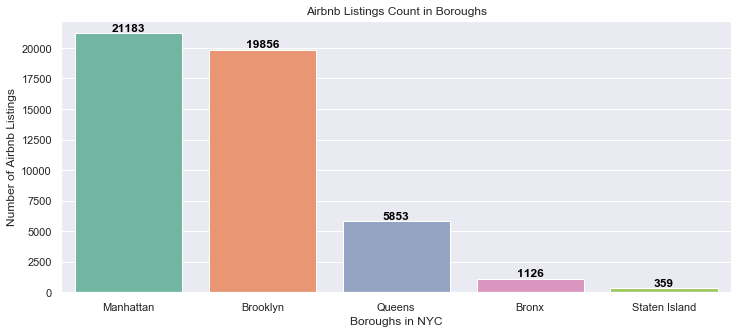

In [21]:
# Visualising listings borough count:

# Setting figure and style
plt.figure(num=1, figsize=(12,5)) 
sns.set(style="darkgrid") 

# Plotting countplot:
g = sns.countplot(x='neighbourhood_group', data=airbnb, palette=sns.color_palette("Set2"), 
                  order=airbnb.neighbourhood_group.value_counts().index); 

# Customising chart:
plt.title('Airbnb Listings Count in Boroughs') 
plt.xlabel('Boroughs in NYC') 
plt.ylabel('Number of Airbnb Listings') 

# Putting count on top of bars:
for bar in g.patches:
    h = bar.get_height()
    g.text(bar.get_x() + bar.get_width()/2., h,'%d' % int(h), ha='center', va='bottom',
           color='black', fontweight='bold', size=12)

plt.show(g) # Show figure

##### Neighbourhood Distribution

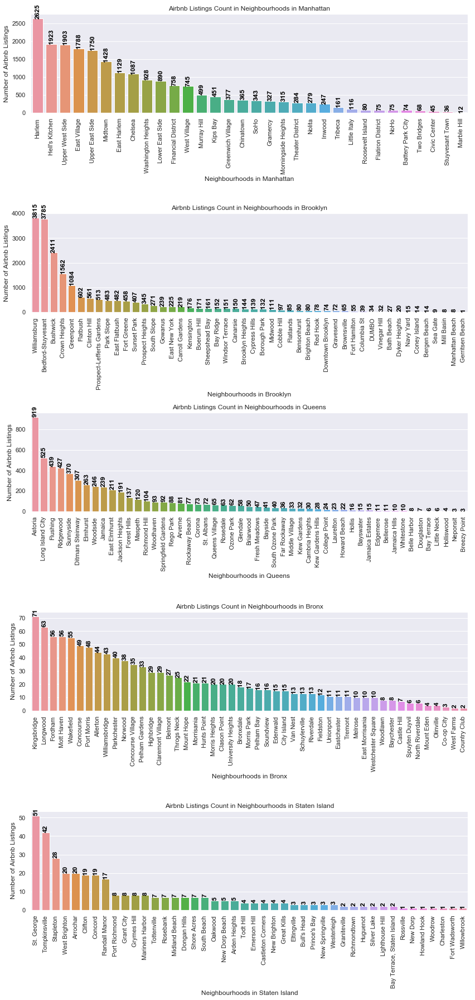

In [22]:
# Visualising listings neighbourhood count:

#Setting figure and figure parameters:
fig = plt.figure(tight_layout=True, figsize=(12,25))
gs = gridspec.GridSpec(5, 1)

ax = fig.add_subplot(gs[0,:]) # Creating subplot
# Plotting chart:
g = sns.countplot(x='neighbourhood', data=airbnb[airbnb['neighbourhood_group'] == 'Manhattan'], 
                  order=airbnb[airbnb['neighbourhood_group']=='Manhattan'].neighbourhood.value_counts().index)
# Customising chart:
plt.xticks(rotation=90)
plt.title('Airbnb Listings Count in Neighbourhoods in Manhattan')
plt.xlabel('Neighbourhoods in Manhattan')
plt.ylabel('Number of Airbnb Listings')
# Putting count on to of bars:
for bar in g.patches:
    h = bar.get_height()
    g.text(bar.get_x() + bar.get_width()/2., h,'%d' % int(h), ha='center', va='bottom',
           color='black', fontweight='bold', size=12, rotation=90)

    
ax = fig.add_subplot(gs[1,:]) # Creating subplot
# Plotting chart:
g = sns.countplot(x='neighbourhood', data=airbnb[airbnb['neighbourhood_group'] == 'Brooklyn'], order=
                  airbnb[airbnb['neighbourhood_group']=='Brooklyn'].neighbourhood.value_counts().index)
# Customising chart:
plt.xticks(rotation=90)
plt.title('Airbnb Listings Count in Neighbourhoods in Brooklyn')
plt.xlabel('Neighbourhoods in Brooklyn')
plt.ylabel('Number of Airbnb Listings')
# Putting count on to of bars:
for bar in g.patches:
    h = bar.get_height()
    g.text(bar.get_x() + bar.get_width()/2., h,'%d' % int(h), ha='center', va='bottom',
           color='black', fontweight='bold', size=12, rotation=90)

    
ax = fig.add_subplot(gs[2,:]) # Creating subplot
# Plotting chart:
g = sns.countplot(x='neighbourhood', data=airbnb[airbnb['neighbourhood_group'] == 'Queens'], order=
                  airbnb[airbnb['neighbourhood_group']=='Queens'].neighbourhood.value_counts().index)
# Customising chart:
plt.xticks(rotation=90)
plt.title('Airbnb Listings Count in Neighbourhoods in Queens')
plt.xlabel('Neighbourhoods in Queens')
plt.ylabel('Number of Airbnb Listings')
# Putting count on to of bars:
for bar in g.patches:
    h = bar.get_height()
    g.text(bar.get_x() + bar.get_width()/2., h,'%d' % int(h), ha='center', va='bottom',
           color='black', fontweight='bold', size=12, rotation=90)

    
ax = fig.add_subplot(gs[3,:]) # Creating subplot
# Plotting chart:
g = sns.countplot(x='neighbourhood', data=airbnb[airbnb['neighbourhood_group'] == 'Bronx'], order=
                  airbnb[airbnb['neighbourhood_group']=='Bronx'].neighbourhood.value_counts().index)
# Customising chart:
plt.xticks(rotation=90)
plt.title('Airbnb Listings Count in Neighbourhoods in Bronx')
plt.xlabel('Neighbourhoods in Bronx')
plt.ylabel('Number of Airbnb Listings')
# Putting count on to of bars:
for bar in g.patches:
    h = bar.get_height()
    g.text(bar.get_x() + bar.get_width()/2., h,'%d' % int(h), ha='center', va='bottom',
           color='black', fontweight='bold', size=12, rotation=90)

    
ax = fig.add_subplot(gs[4,:]) # Creating subplot
# Plotting chart:
g = sns.countplot(x='neighbourhood', data=airbnb[airbnb['neighbourhood_group'] == 'Staten Island'], order=
                  airbnb[airbnb['neighbourhood_group']=='Staten Island'].neighbourhood.value_counts().index)
# Customising chart:
plt.xticks(rotation=90)
plt.title('Airbnb Listings Count in Neighbourhoods in Staten Island')
plt.xlabel('Neighbourhoods in Staten Island')
plt.ylabel('Number of Airbnb Listings')
# Putting count on to of bars:
for bar in g.patches:
    h = bar.get_height()
    g.text(bar.get_x() + bar.get_width()/2., h,'%d' % int(h), ha='center', va='bottom',
           color='black', fontweight='bold', size=12, rotation=90)

plt.show() # Show figure

#### Room Type Distribution

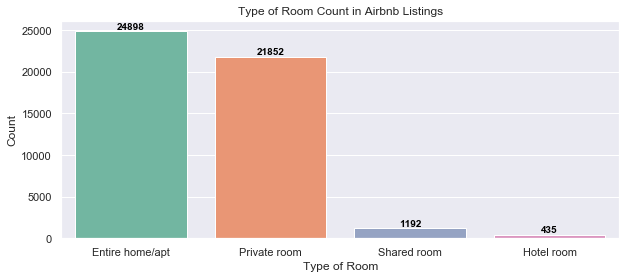

In [23]:
# Visualising room type count
fig = plt.figure(num=1, figsize=(10,4)) # Setting figure and figure parameters
sns.set(style="darkgrid") # Setting chart style
g = sns.countplot(x='room_type', data=airbnb, palette=sns.color_palette("Set2"), 
                  order=airbnb.room_type.value_counts().index); # Plotting chart
plt.title('Type of Room Count in Airbnb Listings') # Setting chart title
plt.xlabel('Type of Room') # Setting label of x-axis
plt.ylabel('Count') # Setting label of y-axis

# Putting count on top of bar
for bar in g.patches:
    h = bar.get_height()
    g.text(bar.get_x() + bar.get_width()/2., h,'%d' % int(h), ha='center', va='bottom',
           color='black', fontweight='bold', size=10)

plt.show(g) # Show figure

#### Last Review Date Distribution

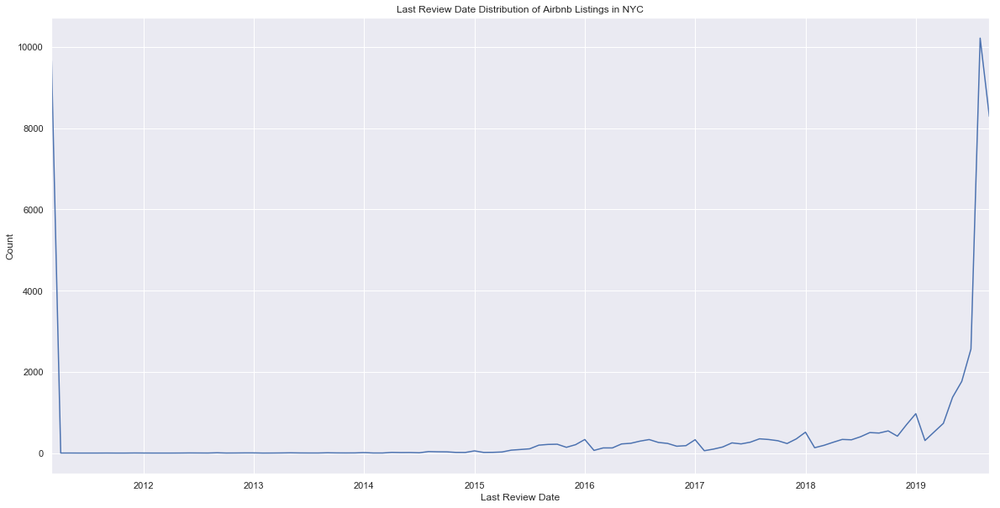

In [24]:
# Visualising review date distribution 
datacount = airbnb.set_index('last_review').resample('MS').size()

fig = plt.figure(num=1, figsize=(20,10)) # Setting figure and figure parameters
sns.set(style="darkgrid") # Setting figure style
datacount.plot()
plt.title('Last Review Date Distribution of Airbnb Listings in NYC') # Setting chart title
plt.xlabel('Last Review Date') # Setting label of x-axis
plt.ylabel('Count') # Setting label of y-axis

plt.show() # Showing figure

**Comment:**

The high at the start is an indication that many of the listings have no reviews since 2011. Then a gradual increase from 2014 in number of reviews and a sharp increase in reviews in 2019. 

#### Price Distribution

Manhattan price: Minimum = $0, Median = $150.0, Maximum = $10000
Brooklyn price: Minimum = $0, Median = $90.0, Maximum = $10000
Queens price: Minimum = $10, Median = $75.0, Maximum = $10000
Bronx price: Minimum = $10, Median = $65.0, Maximum = $1000
Staten Island price: Minimum = $13, Median = $78.0, Maximum = $5000


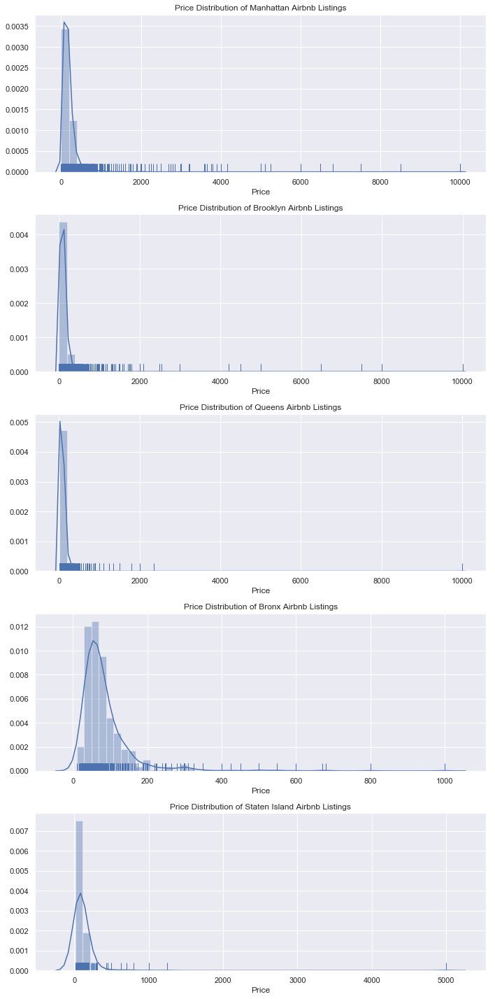

In [25]:
# Price Calculation in Manhattan:
price_manhattan = airbnb[airbnb.neighbourhood_group == 'Manhattan'].price # Dataframe price of manhattan
av_mn = np.median(price_manhattan) # Median price
min_mn = price_manhattan.min(); max_mn = price_manhattan.max() # Minimum and maximum price
print('Manhattan price: ' +'Minimum = $'+ str(min_mn) + ', Median = $' + str(av_mn) + 
      ', Maximum = $' + str(max_mn)) # Printing minimum, median and maximum price

# Price Calculation in Brooklyn:
price_brooklyn = airbnb[airbnb.neighbourhood_group == 'Brooklyn'].price # Dataframe price of Brooklyn
av_bk = np.median(price_brooklyn) # Median price
min_bk = price_brooklyn.min(); max_bk = price_brooklyn.max() # Minimum and maximum price
print('Brooklyn price: ' +'Minimum = $'+ str(min_bk) + ', Median = $' + str(av_bk) + 
      ', Maximum = $' + str(max_bk)) # Printing minimum, median and maximum price

# Price Calculation in Queens:
price_queens = airbnb[airbnb.neighbourhood_group == 'Queens'].price # Dataframe price of Queens
av_qn = np.median(price_queens) # Median price
min_qn = price_queens.min(); max_qn = price_queens.max() # Minimum and maximum price
print('Queens price: ' +'Minimum = $'+ str(min_qn) + ', Median = $' + str(av_qn) + 
      ', Maximum = $' + str(max_qn)) # Printing minimum, median and maximum price

# Price Calculation in Bronx:
price_bronx = airbnb[airbnb.neighbourhood_group == 'Bronx'].price # Dataframe price of Bronx
av_bn = np.median(price_bronx) # Median price
min_bn = price_bronx.min(); max_bn = price_bronx.max() # Minimum and maximum price
print('Bronx price: ' +'Minimum = $'+ str(min_bn) + ', Median = $' + str(av_bn) + 
      ', Maximum = $' + str(max_bn)) # Printing minimum, median and maximum price

# Price Calculation in Staten Island:
price_statenisland = airbnb[airbnb.neighbourhood_group == 'Staten Island'].price # Dataframe price of Staten Island
av_si = np.median(price_statenisland) # Median price
min_si = price_statenisland.min(); max_si = price_statenisland.max() # Minimum and maximum price
print('Staten Island price: ' +'Minimum = $'+ str(min_si) + ', Median = $' + str(av_si) + 
      ', Maximum = $' + str(max_si)) # Printing minimum, median and maximum price


# Visualing price distribution in each borough:
fig = plt.figure(tight_layout=True, figsize=(10,20)) # Setting figure and figure parameters
gs = gridspec.GridSpec(5, 1) # Setting grid specification

ax = fig.add_subplot(gs[0,:]) # adding subplot
g = sns.distplot(price_manhattan, rug= True) # Plotting chart
plt.title('Price Distribution of Manhattan Airbnb Listings') # Setting chart title
plt.xlabel('Price') # Setting label of x-axis

ax = fig.add_subplot(gs[1,:]) # adding subplot
g = sns.distplot(price_brooklyn, rug= True) # Plotting chart
plt.title('Price Distribution of Brooklyn Airbnb Listings') # Setting chart title
plt.xlabel('Price') # Setting label of x-axis

ax = fig.add_subplot(gs[2,:]) # adding subplot
g = sns.distplot(price_queens, rug= True) # Plotting chart
plt.title('Price Distribution of Queens Airbnb Listings') # Setting chart title
plt.xlabel('Price') # Setting label of x-axis

ax = fig.add_subplot(gs[3,:]) # adding subplot
g = sns.distplot(price_bronx, rug= True) # Plotting chart
plt.title('Price Distribution of Bronx Airbnb Listings') # Setting chart title
plt.xlabel('Price') # Setting label of x-axis

ax = fig.add_subplot(gs[4,:]) # adding subplot
g = sns.distplot(price_statenisland, rug= True) # Plotting chart
plt.title('Price Distribution of Staten Island Airbnb Listings') # Setting chart title
plt.xlabel('Price') # Setting label of x-axis

plt.show() # Show figure

**Comment:**

All the boroughs prices are left-skewed.

#### Minimum Night Distribution

Entire home/apt (minimum night spent): Minimum = 1, Median = 3.0, Maximum = 1250
Private room (minimum night spent): Minimum = 1, Median = 2.0, Maximum = 500
Shared room (minimum night spent): Minimum = 1, Median = 1.0, Maximum = 999
Hotel room (minimum night spent): Minimum = 1, Median = 1.0, Maximum = 90


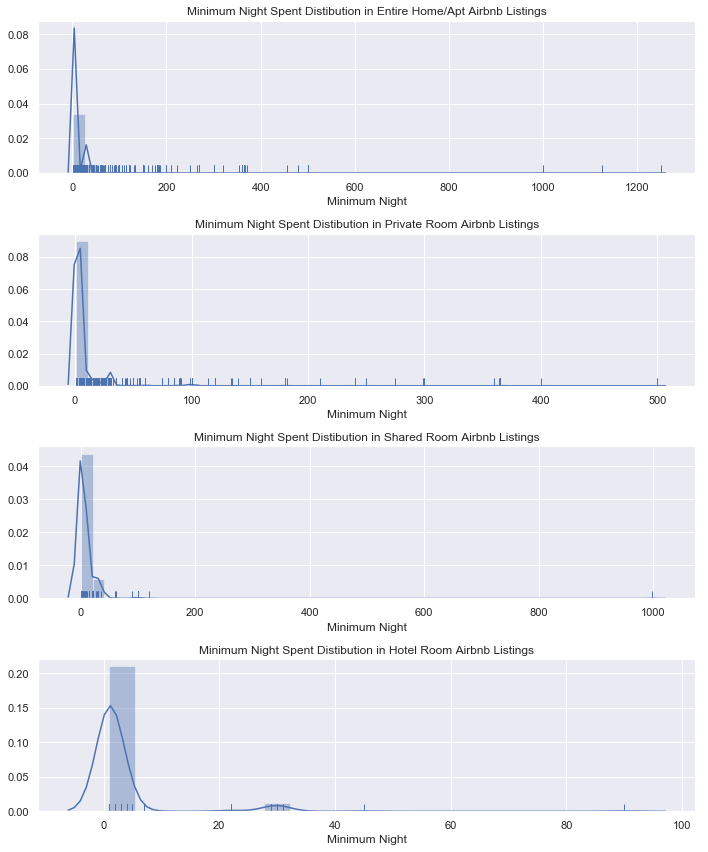

In [26]:
# Minimum night spent in entire home/apt calculation:
home = airbnb[airbnb.room_type == 'Entire home/apt'].minimum_nights # Extracting minimum night of entire home/apt
av_hm = np.median(home); min_hm = home.min(); max_hm = home.max() # Median, minimum and maximum 
print('Entire home/apt (minimum night spent): ' +'Minimum = '+ str(min_hm) + ', Median = ' + 
      str(av_hm) + ', Maximum = ' + str(max_hm)) # Printing median, minimum and maximum

# Minimum night spent in private room calculation:
private = airbnb[airbnb.room_type == 'Private room'].minimum_nights # Extracting minimum night of private room
av_pr = np.median(private); min_pr = private.min(); max_pr = private.max() # Median, minimum and maximum
print('Private room (minimum night spent): ' +'Minimum = '+ str(min_pr) + ', Median = ' + 
      str(av_pr) + ', Maximum = ' + str(max_pr)) # Printing median, minimum and maximum

# Minimum night spent in shared room calculation:
shared = airbnb[airbnb.room_type == 'Shared room'].minimum_nights # Extracting minimum night of shared room
av_sr = np.median(shared); min_sr = shared.min(); max_sr = shared.max() # Median, minimum and maximum
print('Shared room (minimum night spent): ' +'Minimum = '+ str(min_sr) + ', Median = ' + 
      str(av_sr) + ', Maximum = ' + str(max_sr)) # Printing median, minimum and maximum

# Minimum night spent in hotel room calculation:
hotel = airbnb[airbnb.room_type == 'Hotel room'].minimum_nights # Extracting minimum night of Hotel room
av_ht = np.median(hotel); min_ht = hotel.min(); max_ht = hotel.max() # Median, minimum and maximum
print('Hotel room (minimum night spent): ' +'Minimum = '+ str(min_ht) + ', Median = ' + 
      str(av_ht) + ', Maximum = ' + str(max_ht)) # Printing median, minimum and maximum


# Visualising minimum night distribution in different room type:
fig = plt.figure(tight_layout=True, figsize=(10,12)) # Setting figure and figure parameters
gs = gridspec.GridSpec(4, 1) # Setting grid specification

ax = fig.add_subplot(gs[0,:]) # Adding subplot
g = sns.distplot(home, rug= True) # Plotting chart
plt.title('Minimum Night Spent Distibution in Entire Home/Apt Airbnb Listings') # Adding chart title
plt.xlabel('Minimum Night') # Adding label to x-axis

ax = fig.add_subplot(gs[1,:]) # Adding subplot
g = sns.distplot(private, rug= True) # Plotting chart
plt.title('Minimum Night Spent Distibution in Private Room Airbnb Listings') # Adding chart title
plt.xlabel('Minimum Night') # Adding label to x-axis

ax = fig.add_subplot(gs[2,:]) # Adding subplot
g = sns.distplot(shared, rug= True) # Plotting chart
plt.title('Minimum Night Spent Distibution in Shared Room Airbnb Listings') # Adding chart title
plt.xlabel('Minimum Night') # Adding label to x-axis

ax = fig.add_subplot(gs[3,:]) # Adding subplot
g = sns.distplot(hotel, rug= True) # Plotting chart
plt.title('Minimum Night Spent Distibution in Hotel Room Airbnb Listings') # Adding chart title
plt.xlabel('Minimum Night') # Adding label to x-axis

plt.show() # Show figure

**Comment:**

The distribution of minimum night for all room type is left-skewed around the neighbourhood of 2 minimum nights stay.

#### Number Of Reviews Distribution

Number of reviews of listings in Manhattan: Minimum = 0, Median = 4.0, Maximum = 618
Number of reviews of listings in Brooklyn: Minimum = 0, Median = 6.0, Maximum = 469
Number of reviews of listings in Queens: Minimum = 0, Median = 8.0, Maximum = 654
Number of reviews of listings in Bronx: Minimum = 0, Median = 9.0, Maximum = 331
Number of reviews of listings in Staten Island: Minimum = 0, Median = 14.0, Maximum = 360


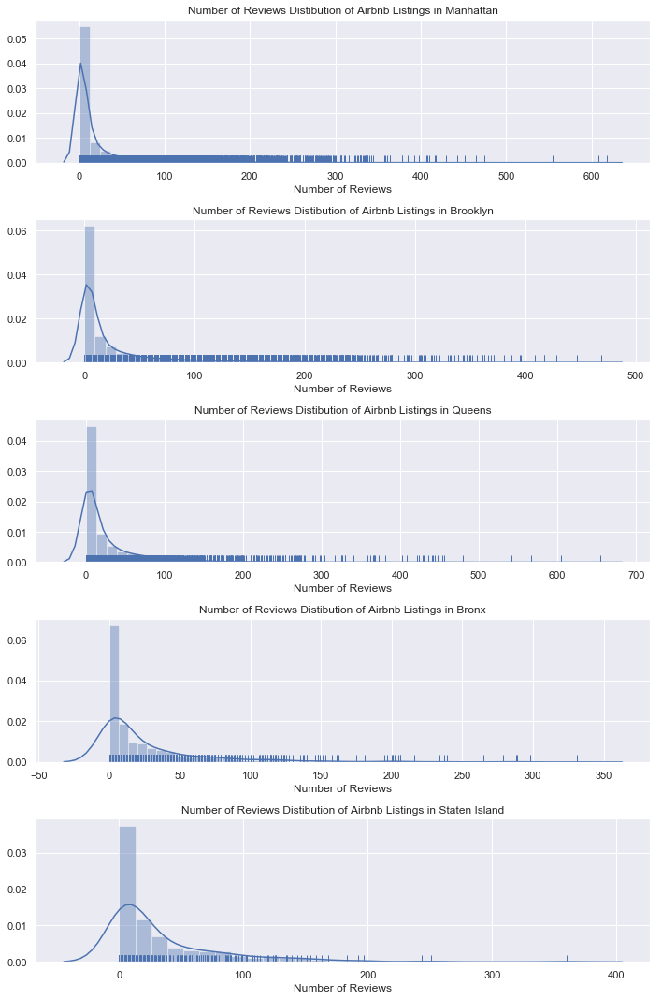

In [27]:
# Number of reviews in Manhattan calculation:
man = airbnb[airbnb.neighbourhood_group == 'Manhattan'].number_of_reviews # Extracting number of reviews in Manhattan
av_mn = np.median(man); min_mn = man.min(); max_mn = man.max() # median, minimum and maximum number of reviews
print('Number of reviews of listings in Manhattan: ' +'Minimum = '+ str(min_mn) + ', Median = ' + 
      str(av_mn) + ', Maximum = ' + str(max_mn))

# Number of reviews in Brooklyn calculation:
brk = airbnb[airbnb.neighbourhood_group == 'Brooklyn'].number_of_reviews # Extracting number of reviews in Brooklyn
av_bk = np.median(brk); min_bk = brk.min(); max_bk = brk.max() # median, minimum and maximum number of reviews
print('Number of reviews of listings in Brooklyn: ' +'Minimum = '+ str(min_bk) + ', Median = ' + 
      str(av_bk) + ', Maximum = ' + str(max_bk)) # Print median, minimum and maximum number of reviews

# Number of reviews in Queens calculation:
qns = airbnb[airbnb.neighbourhood_group == 'Queens'].number_of_reviews # Extracting number of reviews in Queens
av_qn = np.median(qns); min_qn = qns.min(); max_qn = qns.max() # median, minimum and maximum number of reviews
print('Number of reviews of listings in Queens: ' +'Minimum = '+ str(min_qn) + ', Median = ' + 
      str(av_qn) + ', Maximum = ' + str(max_qn)) # Print median, minimum and maximum number of reviews

# Number of reviews in Bronx calculation:
bnx = airbnb[airbnb.neighbourhood_group == 'Bronx'].number_of_reviews # Extracting number of reviews in Bronx
av_bn = np.median(bnx); min_bn = bnx.min(); max_bn = bnx.max() # median, minimum and maximum number of reviews
print('Number of reviews of listings in Bronx: ' +'Minimum = '+ str(min_bn) + ', Median = ' + 
      str(av_bn) + ', Maximum = ' + str(max_bn)) # Print median, minimum and maximum number of reviews

# Number of reviews in Staten Island calculation:
sland = airbnb[airbnb.neighbourhood_group == 'Staten Island'].number_of_reviews # Extracting number of reviews in Staten
av_si = np.median(sland); min_si = sland.min(); max_si = sland.max() # median, minimum and maximum number of reviews
print('Number of reviews of listings in Staten Island: ' +'Minimum = '+ str(min_si) + ', Median = ' + 
      str(av_si) + ', Maximum = ' + str(max_si)) # Print median, minimum and maximum number of reviews


# Visualising number of reviews distribution in boroughs:
fig = plt.figure(tight_layout=True, figsize=(10,15)) # Setting figure and figure parameters
gs = gridspec.GridSpec(5, 1) # Setting grid specification

ax = fig.add_subplot(gs[0,:]) # Adding subplot
g = sns.distplot(man, rug= True) # Plotting chart
plt.title('Number of Reviews Distibution of Airbnb Listings in Manhattan') # Adding chart title
plt.xlabel('Number of Reviews') # Adding label to x-axis

ax = fig.add_subplot(gs[1,:]) # Adding subplot
g = sns.distplot(brk, rug= True) # Plotting chart
plt.title('Number of Reviews Distibution of Airbnb Listings in Brooklyn') # Adding chart title
plt.xlabel('Number of Reviews') # Adding label to x-axis

ax = fig.add_subplot(gs[2,:]) # Adding subplot
g = sns.distplot(qns, rug= True) # Plotting chart
plt.title('Number of Reviews Distibution of Airbnb Listings in Queens') # Adding chart title
plt.xlabel('Number of Reviews') # Adding label to x-axis

ax = fig.add_subplot(gs[3,:]) # Adding subplot
g = sns.distplot(bnx, rug= True) # Plotting chart
plt.title('Number of Reviews Distibution of Airbnb Listings in Bronx') # Adding chart title
plt.xlabel('Number of Reviews') # Adding label to x-axis

ax = fig.add_subplot(gs[4,:]) # Adding subplot
g = sns.distplot(sland, rug= True) # Plotting chart
plt.title('Number of Reviews Distibution of Airbnb Listings in Staten Island') # Adding chart title
plt.xlabel('Number of Reviews') # Adding label to x-axis

plt.show() # Show figure

**Comment:**

The number of reviews is left-skewed with spread increase in order of Staten Island, Bronx, Queens, Brooklyn and Manhattan respectively.

#### Calculated Host Listings Count Distribution

Calculated host listings count: Minimum = 1, Median = 1.0, Maximum = 387


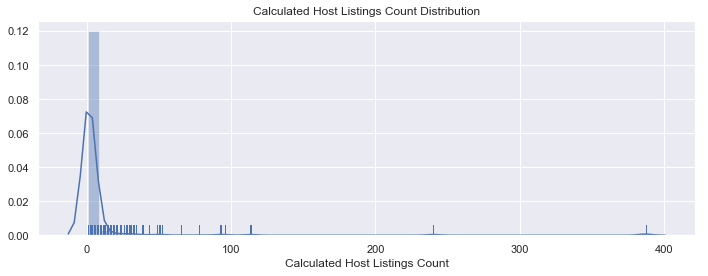

In [28]:
# Calculated host listings count calculation:
host_listings = airbnb.calculated_host_listings_count # Extracting calculated_host_listing_count attribute
av_host = np.median(host_listings); min_host = host_listings.min(); max_host = host_listings.max() # Median, minimum and maximum count
print('Calculated host listings count: ' +'Minimum = '+ str(min_host) + ', Median = ' + 
      str(av_host) + ', Maximum = ' + str(max_host)) # Print minimum, median and maximum count

# Visualising calculated host listings count distribution:
fig = plt.figure(tight_layout=True, figsize=(10,4)) # Setting figure and figure parameters

g = sns.distplot(host_listings, rug= True) # Plotting chart
plt.title('Calculated Host Listings Count Distribution') # Adding title to chart
plt.xlabel('Calculated Host Listings Count') # Adding label to the x-axis

plt.show(g) # Show figure

**Comment:**

The calculated host listings count is left-skewed, with the number of listings belonging to a host around the neighbourhood of one.

#### Availability 365 Distribution

Entire home/apt listings availability (365): Minimum = 0, Median = 45.0, Maximum = 365
Private room listings availability (365): Minimum = 0, Median = 41.0, Maximum = 365
Shared room listings availability (365): Minimum = 0, Median = 94.5, Maximum = 365
Hotel room listings availability (365): Minimum = 0, Median = 329.0, Maximum = 365


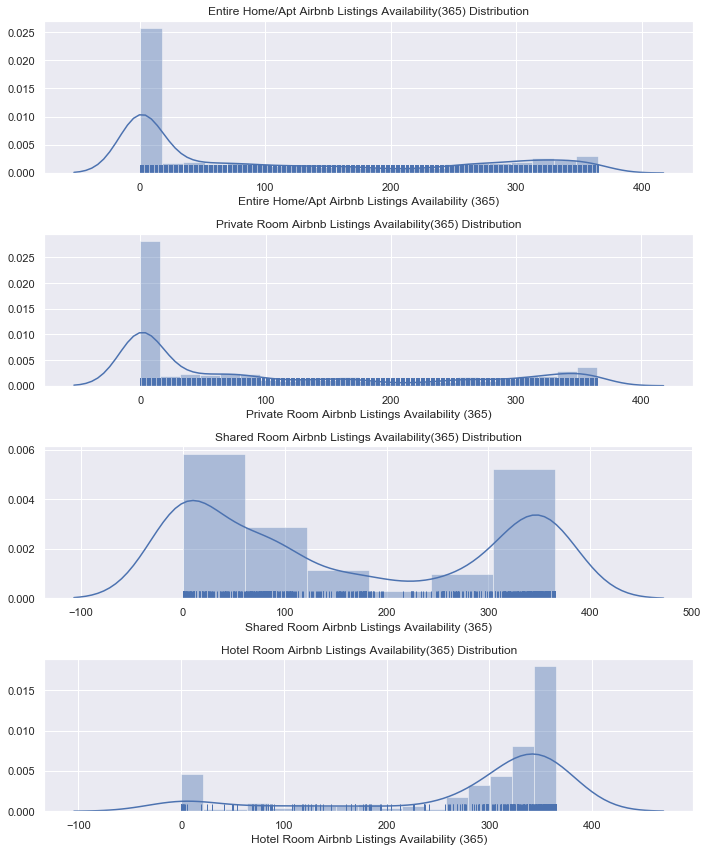

In [29]:
# Availability 365 across entire home/apt calculation:
home = airbnb[airbnb.room_type == 'Entire home/apt'].availability_365 # Extracting availability 365 of entire home/apt
av_hm = np.median(home); min_hm = home.min(); max_hm = home.max() # Median, minimum and maximum availability
print('Entire home/apt listings availability (365): ' +'Minimum = '+ str(min_hm) + ', Median = ' + 
      str(av_hm) + ', Maximum = ' + str(max_hm)) # Printing median, minimum and maximum availability

# Availability 365 across private room calculation:
private = airbnb[airbnb.room_type == 'Private room'].availability_365 # Extracting availability 365 of private room
av_pr = np.median(private); min_pr = private.min(); max_pr = private.max() # Median, minimum and maximum availability
print('Private room listings availability (365): ' +'Minimum = '+ str(min_pr) + ', Median = ' + 
      str(av_pr) + ', Maximum = ' + str(max_pr)) # Printing median, minimum and maximum availability

# Availability 365 across shared room calculation:
shared = airbnb[airbnb.room_type == 'Shared room'].availability_365 # Extracting availability 365 of shared room
av_sr = np.median(shared); min_sr = shared.min(); max_sr = shared.max() # Median, minimum and maximum availability
print('Shared room listings availability (365): ' +'Minimum = '+ str(min_sr) + ', Median = ' + 
      str(av_sr) + ', Maximum = ' + str(max_sr)) # Printing median, minimum and maximum availability

# Availability 365 across hotel room calculation:
hotel = airbnb[airbnb.room_type == 'Hotel room'].availability_365 # Extracting availability 365 of hotel room
av_ht = np.median(hotel); min_ht = hotel.min(); max_ht = hotel.max() # Median, minimum and maximum availability
print('Hotel room listings availability (365): ' +'Minimum = '+ str(min_ht) + ', Median = ' + 
      str(av_ht) + ', Maximum = ' + str(max_ht)) # Printing median, minimum and maximum availability

# Visualising availability 365 distribution:
fig = plt.figure(tight_layout=True, figsize=(10,12)) # Setting figure and figure parameters
gs = gridspec.GridSpec(4, 1) # Setting grid specification

ax = fig.add_subplot(gs[0,:]) # Adding subplot
g = sns.distplot(home, rug= True) # Plotting distribution chart
plt.title('Entire Home/Apt Airbnb Listings Availability(365) Distribution') # Adding chart title
plt.xlabel('Entire Home/Apt Airbnb Listings Availability (365)') # Adding label to the x-axis

ax = fig.add_subplot(gs[1,:]) # Adding subplot
g = sns.distplot(private, rug= True) # Plotting distribution chart
plt.title('Private Room Airbnb Listings Availability(365) Distribution') # Adding chart title
plt.xlabel('Private Room Airbnb Listings Availability (365)') # Adding label to the x-axis

ax = fig.add_subplot(gs[2,:]) # Adding subplot
g = sns.distplot(shared, rug= True) # Plotting distribution chart
plt.title('Shared Room Airbnb Listings Availability(365) Distribution') # Adding chart title
plt.xlabel('Shared Room Airbnb Listings Availability (365)') # Adding label to the x-axis

ax = fig.add_subplot(gs[3,:]) # Adding subplot
g = sns.distplot(hotel, rug= True) # Plotting distribution chart
plt.title('Hotel Room Airbnb Listings Availability(365) Distribution') # Adding chart title
plt.xlabel('Hotel Room Airbnb Listings Availability (365)') # Adding label to the x-axis

plt.show() # Show figure

**Comment:**

All room types have availability ranging from 0 to 365. Entire home/apt and private room have left-skewed distribution, that is, they have short availability. Shared room has a distribution with a heavy tail and head whereas hotel room is right skewed, that is, long availablity of the year.

#### Wordcloud

##### Listings Name

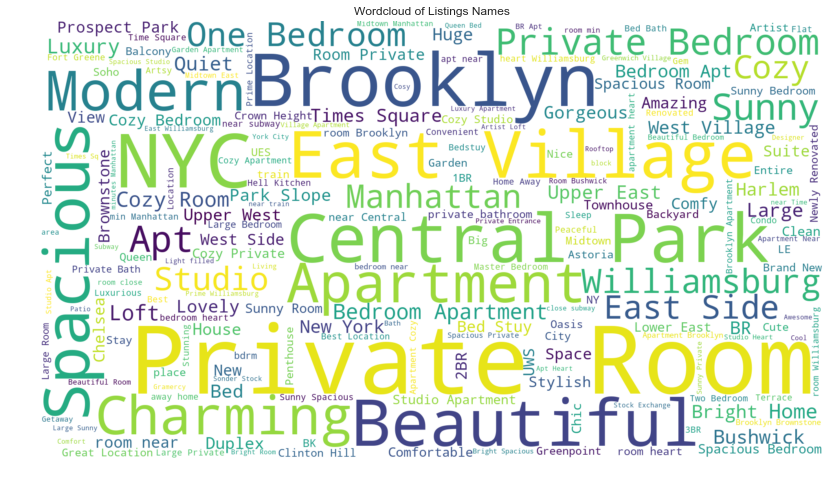

In [30]:
names_text = " ".join([str(name) for name in airbnb['name']]) # Joining all the listings names

# Create and generate a word cloud image:
wordcloud = WordCloud(background_color="white", width=1920, height=1080).generate(names_text)

# Display the generated image:
plt.figure(figsize=(14, 12)) # Setting figure
plt.imshow(wordcloud, interpolation='bilinear') # Plot wordcloud
plt.title('Wordcloud of Listings Names')
plt.axis("off") # Switching off axis
plt.show() # Show figure

**Comment:**

Private room, apartment, spacious, modern, charming, beautiful, sunny, Brooklyn, Manhattan, Williamsburg, East Village, Central Park are some the most used names in the names of listings.

##### Host Name

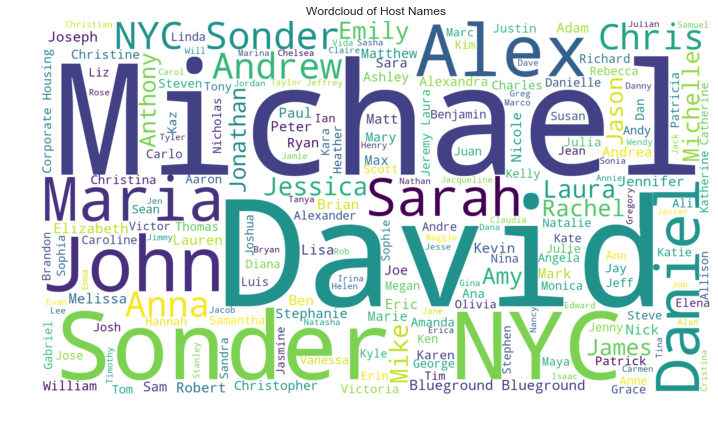

In [31]:
host_name = " ".join([str(name) for name in airbnb['host_name']]) # Joining all host name

# Create and generate a word cloud image:
wordcloud = WordCloud(background_color="white", width=1920, height=1080).generate(host_name)

# Display the generated image:
plt.figure(figsize=(12,12)) # Setting figure
plt.imshow(wordcloud, interpolation='bilinear') # Plotting wordcloud
plt.title('Wordcloud of Host Names') # Setting chart title
plt.axis("off") # Setting axis off
plt.show() # Show figure

**Comment:**

Michael, David, Sonder, NYC, John are some of the very dominant names of the hosts. Which can indicate owners on many listings.

### Exploratory Analysis

#### Attribute Correlation

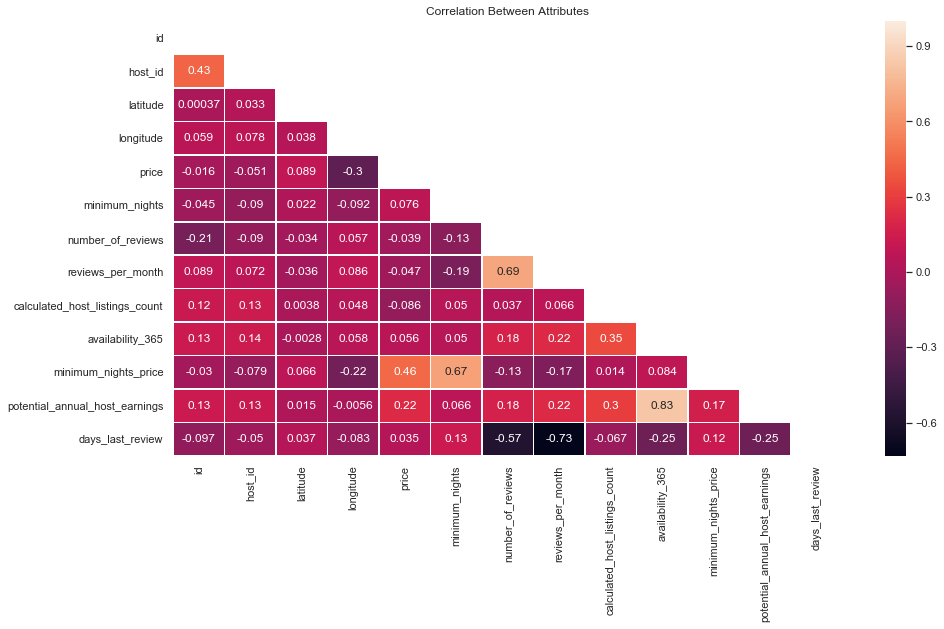

In [32]:
# Correlation:
corr = airbnb.corr(method='kendall') # Kendall correlation  

# Plotting correlation:
plt.figure(figsize=(15,8)) # Setting figure and figure parameters
mask = np.zeros_like(corr) # Initialise mask 
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"): # setting figure style
    ax = sns.heatmap(corr, annot=True, linewidths=.5, mask=mask) # Plotting correlation
plt.title('Correlation Between Attributes') # Setting chart title
plt.show() # Show figure

**Comment:**

Kendall correlation is used because it finds the strength of dependency of attributes on each other.

#### Listings Distribution 

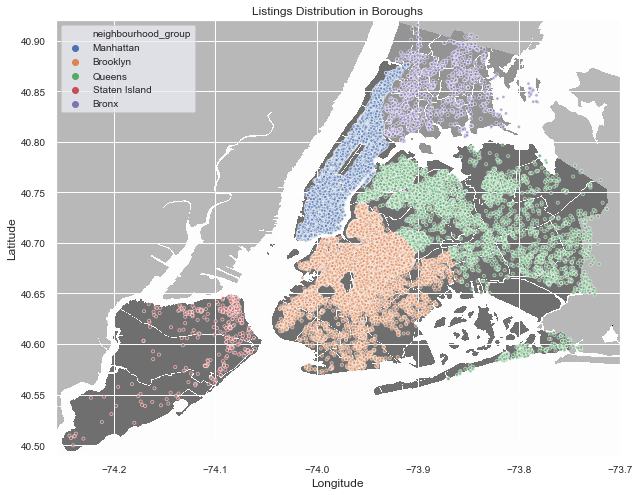

In [33]:
fig, ax = plt.subplots(figsize=(12,8)) # Setting figure and figure parameters

# Show Background image:
img=plt.imread("newyorkcity.png", 0)
coordenates_to_extent = [-74.258, -73.7, 40.49, 40.92]
ax.imshow(img, zorder=0, extent=coordenates_to_extent)

# Plotting scatterplot:
ax = sns.scatterplot(x='longitude', y='latitude', hue='neighbourhood_group',s=10, ax=ax, data=airbnb, alpha=0.6)
ax.grid(True)
plt.title('Listings Distribution in Boroughs', fontsize=12)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.legend(loc='upper left', fontsize=10)
plt.show()

**Comment:**

The above chart shows the boroughs with listings. Manhattan which has the highest population of listings also has the smallest area.

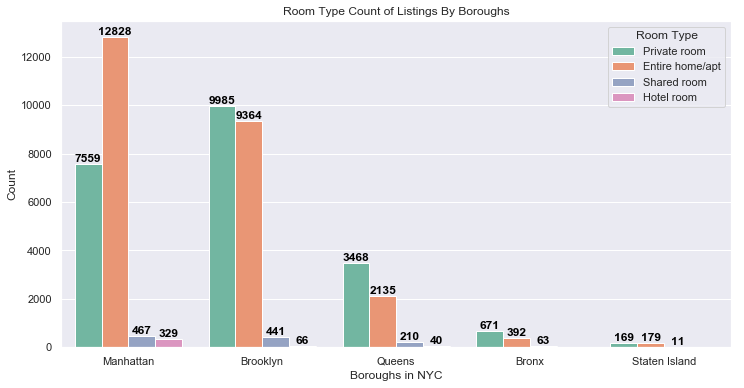

In [34]:
# Setting figure and figure parameters:
plt.figure(figsize=(12,6))
sns.set(style="darkgrid")

# Plotting countplot:
g = sns.countplot(x='neighbourhood_group', data=airbnb, palette=sns.color_palette("Set2"), 
                  hue='room_type', order=airbnb.neighbourhood_group.value_counts().index);
plt.title('Room Type Count of Listings By Boroughs')
plt.xlabel('Boroughs in NYC')
plt.ylabel('Count')
plt.legend(loc='upper right', title='Room Type')

# Annotating count on bars:
for bar in g.patches:
    try:
        h = bar.get_height()
        g.text(bar.get_x() + bar.get_width()/2., h,'%d' % int(h), ha='center', va='bottom', 
               color='black', fontweight='bold', size=12)
    except:
        pass

plt.show() # Show figure

**Comment:**

Bronx and Staten Island have no hotel rooms as listings.

####  Price Exploration

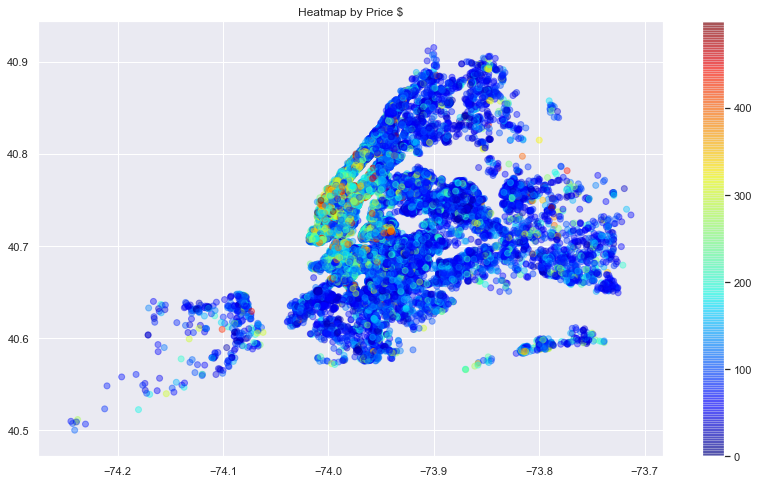

In [35]:
# Filter values:
price_filter = 500 # Listings price of $500 is used so visualisation can be clearer
sub_airbnb = airbnb[airbnb.price < price_filter]


# Setting figure:
fig, ax = plt.subplots(figsize=(14, 8))

# Plotting chart:
cmap = plt.get_cmap('jet') # ColorMaps
c = sub_airbnb.price       # Sequence of color
alpha = 0.5                
label = "airbnb"
price_heatmap = ax.scatter(sub_airbnb.longitude,sub_airbnb.latitude, label=label, c=c, 
                            cmap=cmap, alpha=0.4)

plt.title("Heatmap by Price $")
plt.colorbar(price_heatmap)
plt.grid(True)

plt.show() # Showing figure

**Comment:**

It can be seen that the higher prices are concentrated in Manhattan and part of Brooklyn neighbouring/adjacent to  Manhattan.

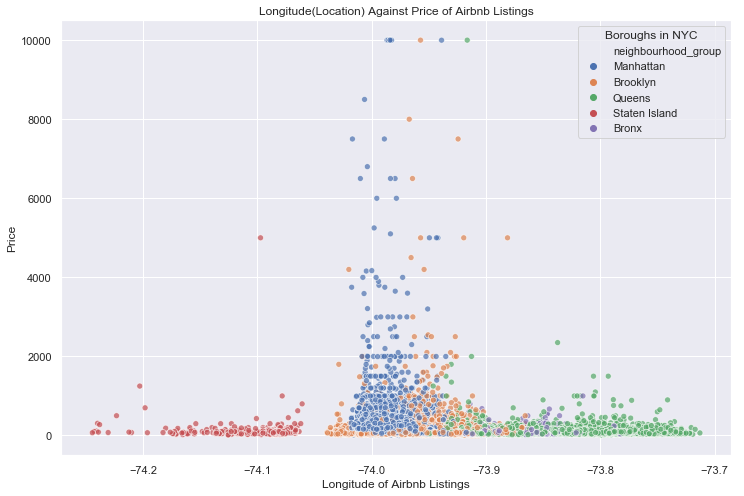

In [36]:
# Setting figure and figure parameters:
plt.figure(num=1, figsize=(12,8))
sns.set(style='darkgrid')

# Plotting scatterplot:
g = sns.scatterplot(x='longitude', y='price', hue='neighbourhood_group', alpha=0.7, data=airbnb)
plt.title('Longitude(Location) Against Price of Airbnb Listings')
plt.xlabel('Longitude of Airbnb Listings')
plt.ylabel('Price')
plt.legend(loc='upper right', title='Boroughs in NYC')

plt.show(g) # Show figure

**Comment:**

The above chart using longitude to represent location further shows price increase in Manhattan and part of Brooklyn.

<Figure size 1080x576 with 0 Axes>

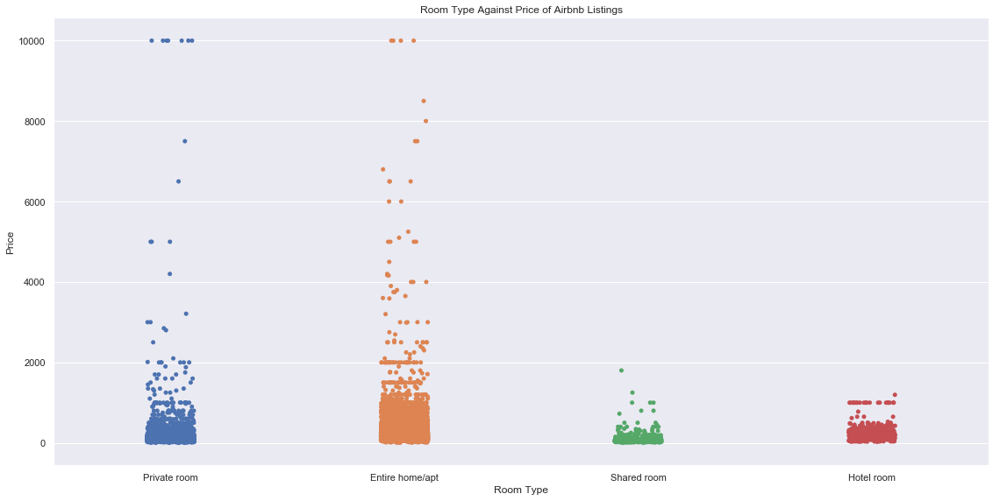

In [37]:
# Setting figure and Style:
plt.figure(num=1, figsize=(15,8))
sns.set(style='darkgrid')

# Plotting catplot:
g = sns.catplot(x="room_type", y="price", data=airbnb, height=8, aspect=2)
plt.title('Room Type Against Price of Airbnb Listings')
plt.xlabel('Room Type')
plt.ylabel('Price')

plt.show() # Showing figure

**Comment:**

Entire home/apt has the highest price distribution followed by private room. Shared room and hotel have similar small price distribution.

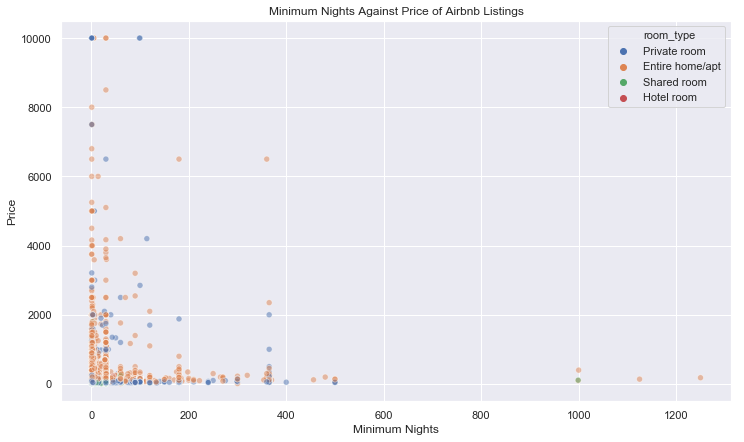

In [38]:
# Setting figure and style
plt.figure(num=1, figsize=(12,7))
sns.set(style='darkgrid')

#Plotting scatterplot:
g = sns.scatterplot(x='minimum_nights', y='price', hue='room_type', alpha=0.5, data=airbnb)
plt.title('Minimum Nights Against Price of Airbnb Listings')
plt.xlabel('Minimum Nights')
plt.ylabel('Price')
plt.legend(loc='upper right')

plt.show(g) # Show figure

**Comment:**

Listings with shorter stay have a higher price compared to those with longer minimum nights.

#### Host Listings Exploration

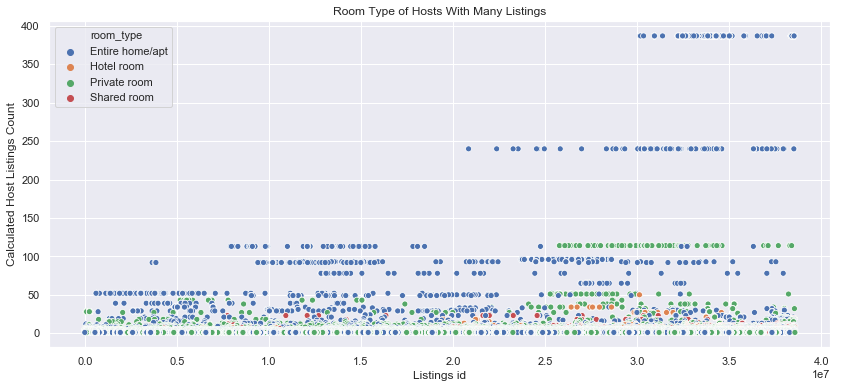

In [40]:
# Creating a copy of data sorted by calculated host listings count:
host_count = airbnb.sort_values(by='calculated_host_listings_count', ascending=False)

# Setting figure for visualisation:
plt.figure(num=1, figsize=(14,6))
sns.set(style="darkgrid")

# Plotting chart
g = sns.scatterplot(x='id',y='calculated_host_listings_count', data=host_count, hue='room_type')
plt.title('Room Type of Hosts With Many Listings')
plt.xlabel('Listings id')
plt.ylabel('Calculated Host Listings Count')
plt.legend(loc='upper left')

plt.show(g) # Show figure

**Comment:**

Hosts with most listings have mostly entire home/apt room type followed by private room.

#### Review Exploration

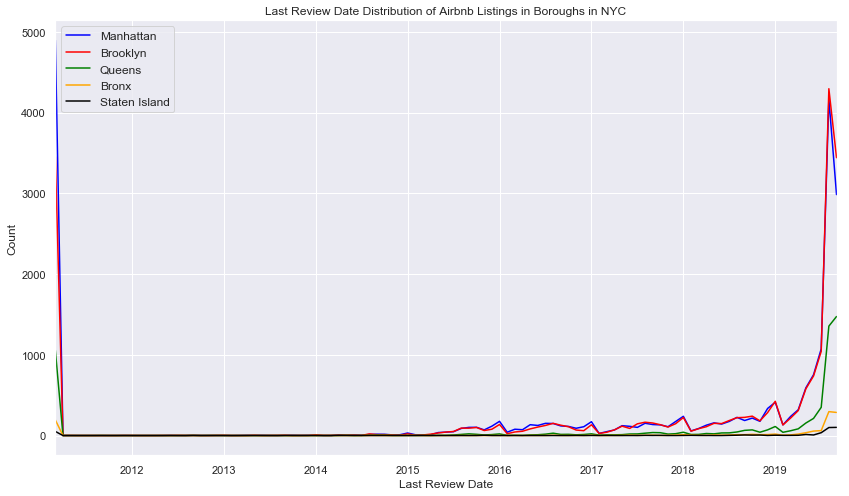

In [41]:
# Extracting dates of last review for each borough:
date_manhattan = airbnb[airbnb['neighbourhood_group'] == 'Manhattan'].set_index('last_review').resample('MS').size()
date_brooklyn = airbnb[airbnb['neighbourhood_group'] == 'Brooklyn'].set_index('last_review').resample('MS').size()
date_queens = airbnb[airbnb['neighbourhood_group'] == 'Queens'].set_index('last_review').resample('MS').size()
date_bronx = airbnb[airbnb['neighbourhood_group'] == 'Bronx'].set_index('last_review').resample('MS').size()
date_sland = airbnb[airbnb['neighbourhood_group'] == 'Staten Island'].set_index('last_review').resample('MS').size()

# Setting figure and style:
fig = plt.figure(num=1, figsize=(14,8)) 
sns.set(style="darkgrid") 

#Plotting dates of last review of boroughs:
date_manhattan.plot(label='Manhattan', color='blue')
date_brooklyn.plot(label='Brooklyn', color='red')
date_queens.plot(label='Queens', color='green')
date_bronx.plot(label='Bronx', color='orange')
date_sland.plot(label='Staten Island', color='black')

# Customising plot:
plt.title('Last Review Date Distribution of Airbnb Listings in Boroughs in NYC') 
plt.xlabel('Last Review Date') 
plt.ylabel('Count') 
plt.legend(loc='upper left', fontsize=12)

plt.show() # Showing figure

**Comment:**

Manhattan and Brookly have similar movement as the highest followed by Queens, Bronx and Staten Island respectively. Many listings have no reviews before 2011 and gradual increase and a sharp increase, especially for Manhattan and Brooklyn.

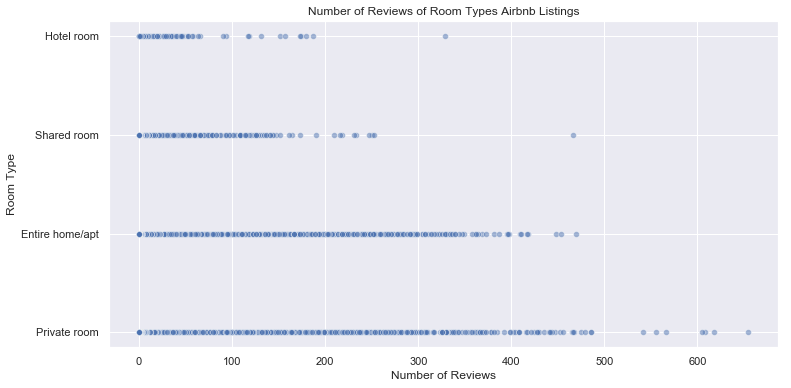

In [53]:
# Setting figure and style:
plt.figure(figsize=(12,6))
sns.set(style='darkgrid')

# Plotting chart:
g = sns.scatterplot(x='number_of_reviews', y='room_type', alpha=0.5, data=airbnb)
plt.title('Number of Reviews of Room Types Airbnb Listings')
plt.xlabel('Number of Reviews')
plt.ylabel('Room Type')

plt.show(g) # Show figure

**Comment:**

Private room listings have the highest number of reviews followd by Entire home/apt, shared room and hotel room respectively.

#### Availability 

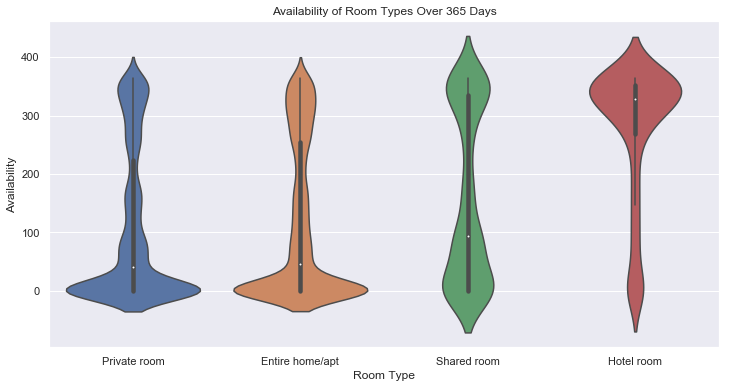

In [42]:
# Setting figure style:
plt.figure(figsize=(12,6))
sns.set(style="darkgrid")

# Plotting violinplot:
sns.violinplot(x='room_type',y='availability_365', data=airbnb)
plt.title('Availability of Room Types Over 365 Days')
plt.xlabel('Room Type')
plt.ylabel('Availability')

plt.show() # Show figure

**Comment:**

Most private room and entire home/apt has shorter availability, shared room listings have almost equal number of short and long availability whereas most hotel room listings have long availability in a year. 

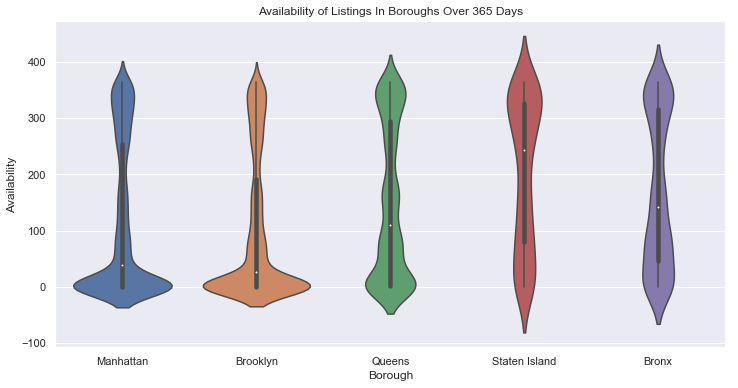

In [43]:
# Setting figure style:
plt.figure(figsize=(12,6))
sns.set(style="darkgrid")

# Plotting violinplot:
sns.violinplot(x='neighbourhood_group',y='availability_365', data=airbnb)
plt.title('Availability of Listings In Boroughs Over 365 Days')
plt.xlabel('Borough')
plt.ylabel('Availability')

plt.show() # Show figure

**Comment:**

Availability of most listings in Manhattan and Brooklyn have shorter availability whereas Queen, Bronx and Staten Island listings have almost equal distribution of long and short availability over the year.

#### Minimum Nights Price 

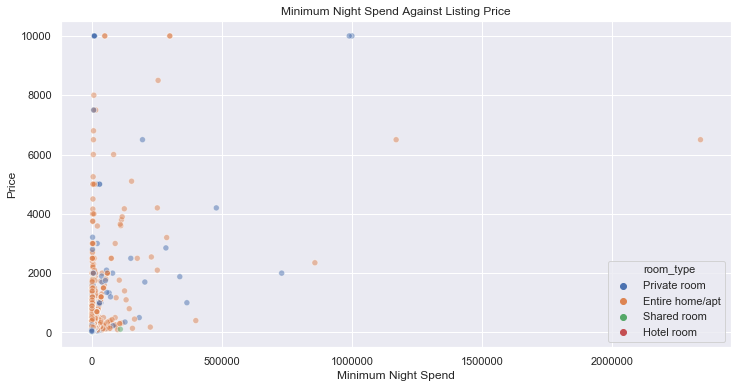

In [44]:
# Setting figure and style:
plt.figure(num=1, figsize=(12,6))
sns.set(style="darkgrid")

# Plotting scatterplot:
g = sns.scatterplot(x='minimum_nights_price',y='price', hue='room_type', alpha=0.5, data=airbnb)
plt.title('Minimum Night Spend Against Listing Price')
plt.xlabel('Minimum Night Spend')
plt.ylabel('Price')
plt.legend(loc='lower right')

plt.show(g) # Show figure

**Comment:**

Listings with lower minimum night spend tend to have higher price per night.

#### Minimum Night

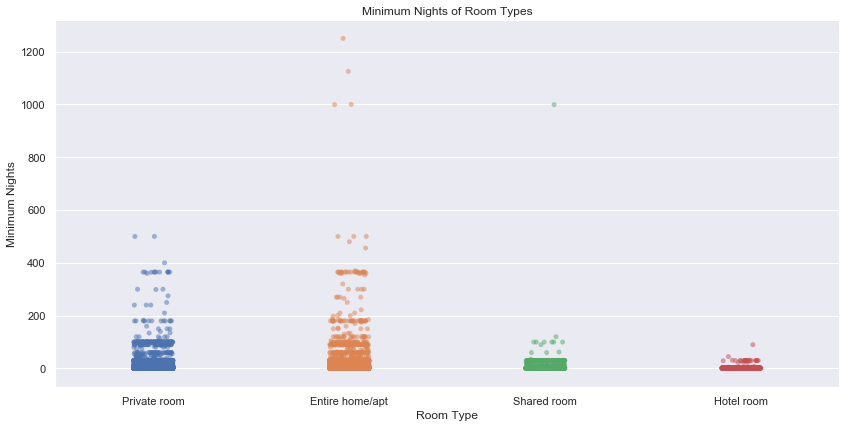

In [45]:
# Setting figure style:
sns.set(style="darkgrid")

# Plotting scatterplot:
sns.catplot(x='room_type',y='minimum_nights', alpha=0.5, data=airbnb, height=6, aspect=2)
plt.title('Minimum Nights of Room Types')
plt.xlabel('Room Type')
plt.ylabel('Minimum Nights')

plt.show() # Show figure

**Comment:**

The minimum nights of entire home/apt and private room listings tend to be longer than share room and hotel room listings.

#### Potential Annual Host Earnings

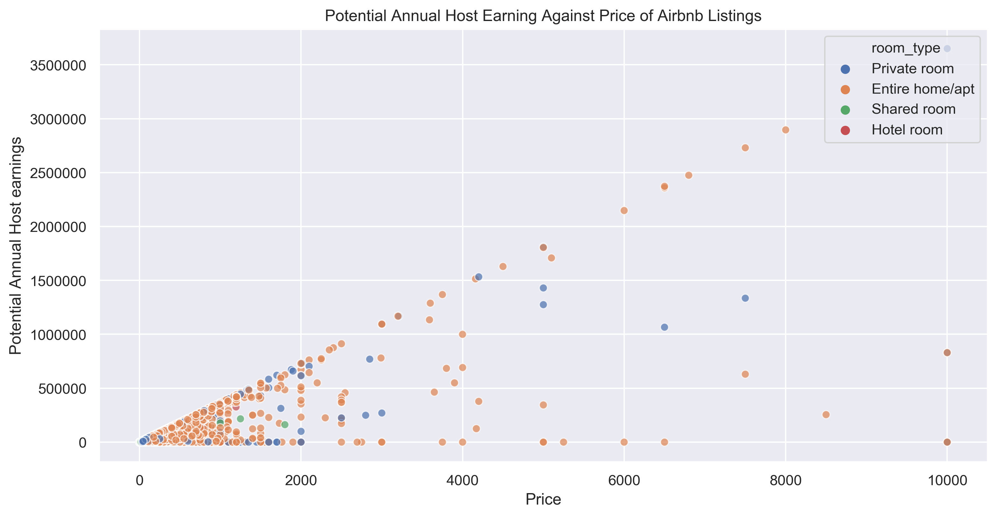

In [67]:
# Setting figure and style:
plt.figure(num=1, figsize=(12,6))
sns.set(style='darkgrid')

# Plotting scatterplot:
g = sns.scatterplot(y='potential_annual_host_earnings', x='price', hue='room_type', alpha=0.7, data=airbnb)
plt.title('Potential Annual Host Earning Against Price of Airbnb Listings')
plt.ylabel('Potential Annual Host earnings')
plt.xlabel('Price')
plt.legend(loc='upper right')

plt.show(g) # Show figure

**Comment:**

There is a threshold where price increase with potential annual host income is directly proportional

### Spatial Analysis

#### Borough Spatial Concentration of Listings

In [46]:
# Plotting of folium heatmap:
map = folium.Map([40.7128,-74.0060],zoom_start=10)
folium.plugins.HeatMap(airbnb[['latitude','longitude']].dropna(),
                       radius=8, gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(map)
display(map)

**Comment:**

Manhattan and part of Brooklyn, adjacent to Manhattan and located centrally in the city have the highest concentration of listings.

#### Subway And Airbnb Spatial Analysis

In [47]:
# Extracting and normalising borough data for listings concentration:
df = pd.DataFrame(airbnb['neighbourhood_group'].value_counts())
df.reset_index(level=0, inplace=True)
df.columns = ['boro_name', 'boro_count']
df['boro_count'] = (df['boro_count']-df['boro_count'].min())/(df['boro_count'].max()-df['boro_count'].min())

# Creating folium map
m = folium.Map([40.7128,-74.0060],zoom_start=10)

# Adding choropleth to folium map:
folium.Choropleth(
    geo_data=borough,
    name='geometry',
    data=df,
    columns=['boro_name', 'boro_count'],
    key_on='feature.properties.boro_name',
    fill_color='YlGn',
    fill_opacity=0.9,
    line_opacity=0.5,
    legend_name='Airbnb Listings Concentration').add_to(m)

# Adding subway station points to folium map:
subway = pd.DataFrame(subway)
for index,row in subway.iterrows():
    folium.Circle(location=(row['geometry'].y, row['geometry'].x), popup=row['name'], radius=10,
    color='blue',fill=True).add_to(m)

# Adding control layer to folium map:    
folium.LayerControl().add_to(m)    
display(m)

**Comment:**

Manhattan and Brooklyn which has good subway network and correlate with the high number of Airbnb listings.

#### Places of Interest and Listings Spatial Analysis

In [48]:
# Plotting folium map:
m = folium.Map([40.7128,-74.0060],zoom_start=10)

# Adding choropleth of boroughs to folium map:
folium.Choropleth(
    geo_data=borough,
    name='geometry',
    data=df,
    columns=['boro_name', 'boro_count'],
    key_on='feature.properties.boro_name',
    fill_color='YlGn',
    fill_opacity=0.9,
    line_opacity=0.5,
    legend_name='Airbnb Listings Concentration').add_to(m)

# Adding places of interest points to folium map:
for index,row in interest.iterrows():
    folium.Circle(location=(row['geometry'].y, row['geometry'].x), popup=row['name'], radius=10,
    color='crimson',fill=True).add_to(m)

# Adding a control layer to folium map:    
folium.LayerControl().add_to(m)    
display(m)

**Comment:**

The number of Airbnb listings showing no dependency on the location of places of interest.

## Modelling and Prediction

### Preprocessing For Modelling

#### Dropping Columns

In [49]:
to_drop = ['name', 'host_name', 'neighbourhood', 'last_review'] # Attributes to drop

# Making a of dataset and dropping attributes:
transformed_airbnb = airbnb 
transformed_airbnb.drop(to_drop, axis=1, inplace=True)
transformed_airbnb.head()

,id,host_id,neighbourhood_group,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,minimum_nights_price,potential_annual_host_earnings,days_last_review
0,3647,4632,Manhattan,40.80902,-73.94190,Private room,150,3,0,0.00,1,365,450,54750,3108.0
1,3831,4869,Brooklyn,40.68514,-73.95976,Entire home/apt,89,1,279,4.62,1,192,89,17088,32.0
2,5022,7192,Manhattan,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0,800,0,315.0
3,5099,7322,Manhattan,40.74767,-73.97500,Entire home/apt,200,3,75,0.59,1,13,600,2600,71.0
4,5121,7356,Brooklyn,40.68688,-73.95596,Private room,60,45,49,0.39,1,0,2700,0,725.0


#### Encoding 

In [50]:
# Tranforming categorical features (one-hot encoding):
model_airbnb = pd.get_dummies(transformed_airbnb)
model_airbnb.head()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,...,days_last_review,neighbourhood_group_Bronx,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room
0,3647,4632,40.80902,-73.94190,150,3,0,0.00,1,365,...,3108.0,0,0,1,0,0,0,0,1,0
1,3831,4869,40.68514,-73.95976,89,1,279,4.62,1,192,...,32.0,0,1,0,0,0,1,0,0,0
2,5022,7192,40.79851,-73.94399,80,10,9,0.10,1,0,...,315.0,0,0,1,0,0,1,0,0,0
3,5099,7322,40.74767,-73.97500,200,3,75,0.59,1,13,...,71.0,0,0,1,0,0,1,0,0,0
4,5121,7356,40.68688,-73.95596,60,45,49,0.39,1,0,...,725.0,0,1,0,0,0,0,0,1,0


**Comment:**

One-hot encoding was used to one the categorical data because the are nominal and not ordinal. This also transforms it from categorical to numeric which work which improves the performance of the model.

In [51]:
# Correlation heatmap of encoded dataframe:

def multi_heatmap(df, figsize=(15,15)):
    """ Create a heatmap of correlation between features in the df """
    # Set Style of visualisation:
    sns.set(style='white')
    
    #Create covariance matrix:
    corr = df.corr()
    
    # Generate a mask of the size of our covariance matrix:
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    
    # Set up the figure:
    f, ax = plt.subplots(figsize=figsize)
    
    # Generate a custom diverging colormap:
    cmap = sns.diverging_palette(220, 10, as_cmap=True)
    
    # Draw the heatmap with the mask and correct aspect ratio:
    sns.heatmap(corr, mask=mask, cmap=cmap, center=0, square=True, 
                linewidth=.5, cbar_kws={'shrink':.5}, vmax=corr[corr != 1.0].max().max());
 

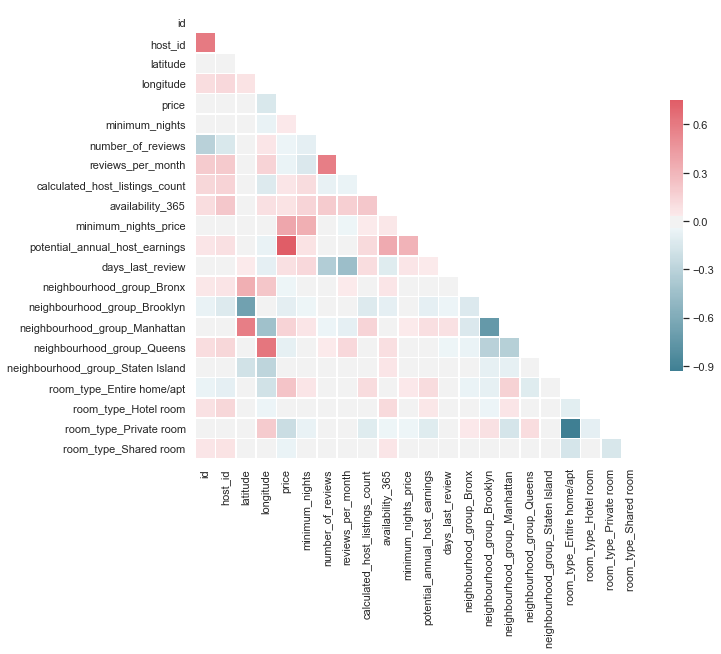

In [52]:
# Plotting correlaton heatmap:
multi_heatmap(model_airbnb, figsize=(10,10))

#### Log Transformation

In [53]:
# Rearranging features so the target feature will be at the end:
model_airbnb = model_airbnb[['id','host_id','latitude', 'longitude', 'minimum_nights', 'number_of_reviews', 
                             'reviews_per_month', 'calculated_host_listings_count', 'availability_365', 
                             'minimum_nights_price', 'potential_annual_host_earnings', 'days_last_review', 
                             'neighbourhood_group_Bronx', 'neighbourhood_group_Brooklyn', 
                             'neighbourhood_group_Manhattan', 'neighbourhood_group_Queens', 
                             'neighbourhood_group_Staten Island', 'room_type_Entire home/apt', 
                             'room_type_Hotel room', 'room_type_Private room', 'room_type_Shared room', 
                             'price']];
model_airbnb.head()                             

,id,host_id,latitude,longitude,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,minimum_nights_price,...,neighbourhood_group_Bronx,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room,price
0,3647,4632,40.80902,-73.94190,3,0,0.00,1,365,450,...,0,0,1,0,0,0,0,1,0,150
1,3831,4869,40.68514,-73.95976,1,279,4.62,1,192,89,...,0,1,0,0,0,1,0,0,0,89
2,5022,7192,40.79851,-73.94399,10,9,0.10,1,0,800,...,0,0,1,0,0,1,0,0,0,80
3,5099,7322,40.74767,-73.97500,3,75,0.59,1,13,600,...,0,0,1,0,0,1,0,0,0,200
4,5121,7356,40.68688,-73.95596,45,49,0.39,1,0,2700,...,0,1,0,0,0,0,0,1,0,60


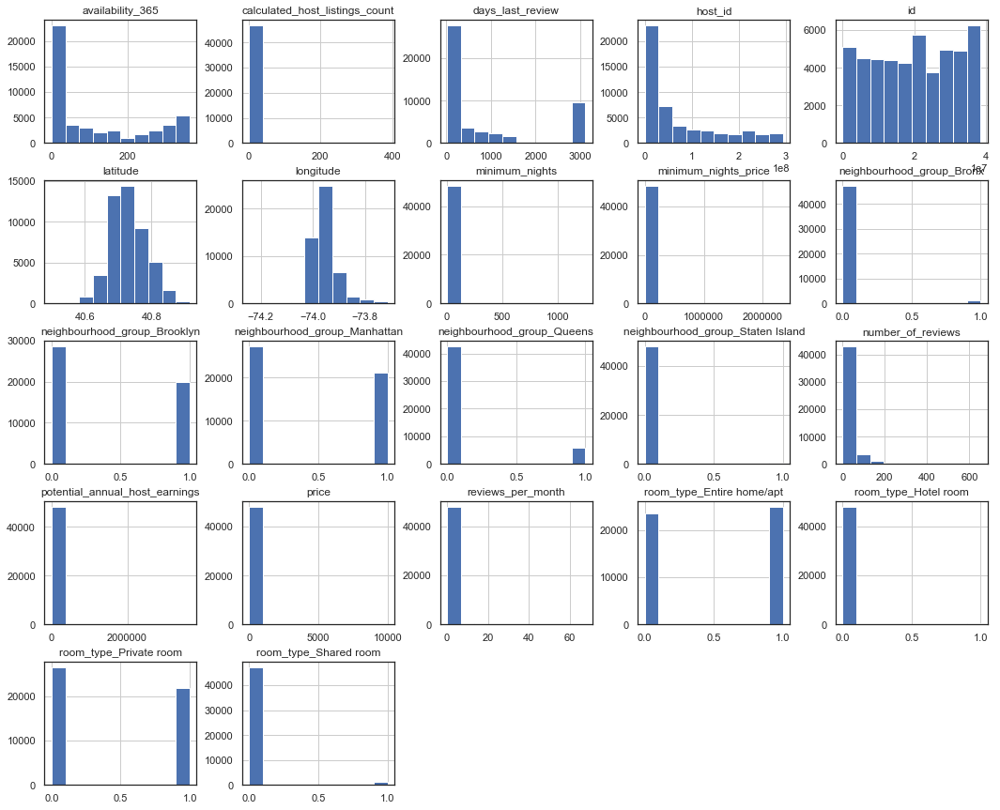

In [54]:
#Plotting distribution of data before log transforming modelling:
model_airbnb.hist(figsize=(18,15))
plt.show()

**Comment:**

Most of the features have very skewed distribution, thus, log transforming them will aid reduce the skewness.

In [55]:
#Log transforming columns:
columns = ['minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 
           'minimum_nights_price', 'potential_annual_host_earnings', 'days_last_review', 'neighbourhood_group_Bronx', 
           'neighbourhood_group_Brooklyn', 'neighbourhood_group_Manhattan', 'neighbourhood_group_Queens', 
           'neighbourhood_group_Staten Island', 'room_type_Entire home/apt', 'room_type_Hotel room', 
           'room_type_Private room', 'room_type_Shared room', 'price']
                
for col in columns:
    model_airbnb[col] = model_airbnb[col].astype('float64').replace(0.0, 0.01) # Change to float and replace 0s with 0.01
    model_airbnb[col] = np.log(model_airbnb[col])

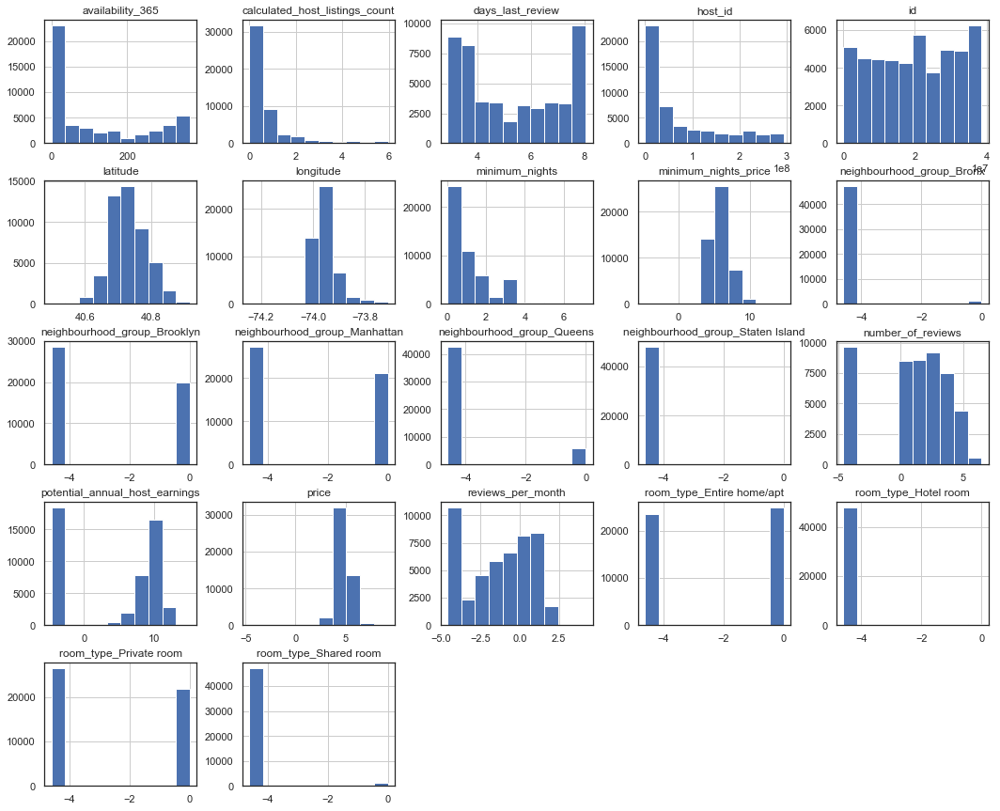

In [56]:
#Plotting transformed distribution of data for modeling
model_airbnb.hist(figsize=(18,15))
plt.show()

**Comment:**

The log transformation has improved the distribution of some of the features especially the target variable 'price'.

#### Standardisation

In [57]:
# Separating predictors(X) features and target(y) feature
X,y = model_airbnb.iloc[:,:-1], model_airbnb.iloc[:,-1]

# Standardising predictors
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=list(X.columns))

**Comment:**

Standardisation is implemented here so outliers effect is minimised.

### XGBoost Regressor Model

In [58]:
# Splitting predictor features and target feature into test and training set:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

In [59]:
# Xgboost regression:
xgb_reg_start = time.time() # Timer to time process

# Initialise and train regressor:
xgb_reg = xgb.XGBRegressor()
xgb_reg.fit(X_train, y_train)
training_preds_xgb_reg = xgb_reg.predict(X_train)
val_preds_xgb_reg = xgb_reg.predict(X_test)

xgb_reg_end = time.time() # End time

print(f'Time taken to run: {round((xgb_reg_end - xgb_reg_start)/60,1)} minutes')
print('\nTraining MSE:', round(mean_squared_error(y_train, training_preds_xgb_reg),4))
print('Validation MSE:', round(mean_squared_error(y_test, val_preds_xgb_reg),4))
print('\nTraining r2:', round(r2_score(y_train, training_preds_xgb_reg),4))
print('Validation r2:', round(r2_score(y_test, val_preds_xgb_reg),4))

[20:33:05] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Time taken to run: 0.1 minutes

Training MSE: 0.0164
Validation MSE: 0.0176

Training r2: 0.9675
Validation r2: 0.9656


In [60]:
# Creating dataframe of feature importance:
df_weights_xgb_reg = pd.DataFrame(xgb_reg.feature_importances_, columns=['feature_importance'], index=X_train.columns)
df_weights_xgb_reg.sort_values('feature_importance', inplace=True)
df_weights_xgb_reg

,feature_importance
id,0.000000
room_type_Hotel room,0.000000
neighbourhood_group_Staten Island,0.000000
neighbourhood_group_Queens,0.000000
neighbourhood_group_Brooklyn,0.000000
number_of_reviews,0.000000
reviews_per_month,0.000000
neighbourhood_group_Bronx,0.000000
calculated_host_listings_count,0.000078
room_type_Shared room,0.000724


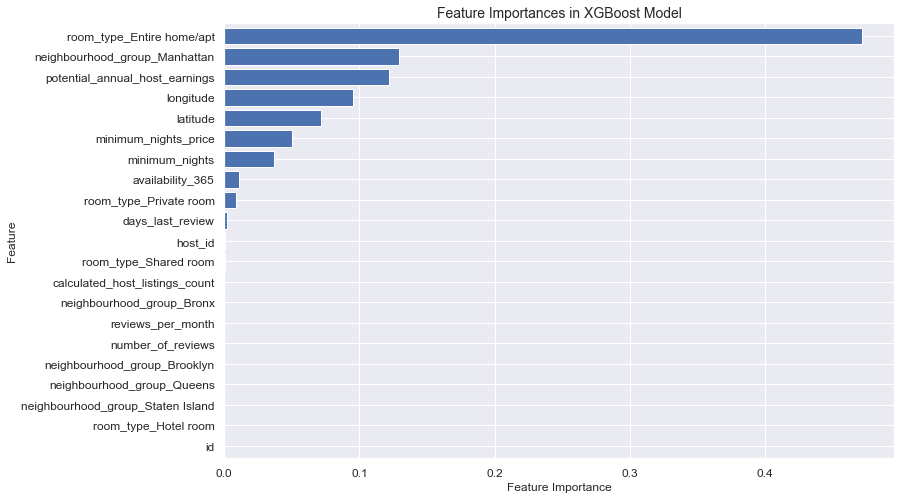

In [66]:
# Plotting feature importances:
plt.figure(figsize=(12, 8))
sns.set(style="darkgrid")
plt.barh(df_weights_xgb_reg.index, df_weights_xgb_reg.feature_importance, align='center')
plt.title('Feature Importances in XGBoost Model', fontsize=14)
plt.xlabel('Feature Importance', fontsize=12)
plt.ylabel('Feature', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.margins(y=0.01)
plt.show()

**Comment:**

A basic XGBoost regression model is used to predict price in order to provide a baseline level of accuracy and a measure of feature importance which is the primary purpose of this modelling. This is shown in the feature importance of features in predicting price. XGBoost was chosen because of its superior performance such that even hyper-parameter tuning will only add small increment in accuracy.


### Random Forest Regressor Model

In [67]:
# Random forest regression:
rfr_reg_start = time.time() # Process timer

# Initialise and train regressor:
regr = RandomForestRegressor(oob_score=True)
regr.fit(X_train, y_train)

rfr_reg_end = time.time() # End time

print(f'Time taken to run: {round((rfr_reg_end - rfr_reg_start)/60,1)} minutes')
print('\nOOB Score:', round(regr.oob_score_,4))
print('R^2 Training Score:', round(regr.score(X_train, y_train),4))
print('R^2 Validation Score:', round(regr.score(X_test, y_test),4))

Time taken to run: 0.1 minutes

OOB Score: 0.5251
R^2 Training Score: 0.9986
R^2 Validation Score: 0.9941


In [68]:
# Creating dataframe of feature importance:
df_weights_rf_reg = pd.DataFrame(regr.feature_importances_, columns=['feature_importance'], index=X_train.columns)
df_weights_rf_reg.sort_values('feature_importance', inplace=True)
df_weights_rf_reg

,feature_importance
neighbourhood_group_Staten Island,0.000001
neighbourhood_group_Bronx,0.000003
neighbourhood_group_Queens,0.000007
room_type_Hotel room,0.000044
neighbourhood_group_Brooklyn,0.000051
room_type_Private room,0.000079
number_of_reviews,0.000152
days_last_review,0.000192
reviews_per_month,0.000206
id,0.000415


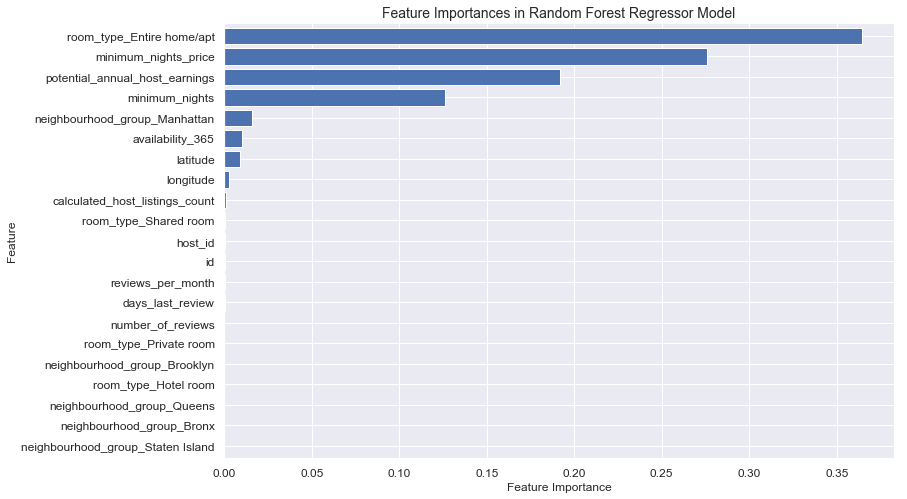

In [69]:
# Plotting feature importances:
plt.figure(figsize=(12, 8))
sns.set(style="darkgrid")
plt.barh(df_weights_rf_reg.index, df_weights_rf_reg.feature_importance, align='center')
plt.title('Feature Importances in Random Forest Regressor Model', fontsize=14)
plt.xlabel('Feature Importance', fontsize=12)
plt.ylabel('Feature', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.margins(y=0.01)
plt.show()

**Comment:**

Similar to XGBoost, random forest was chosen because of its superior accuracy over it constituent models individually. The primary purpose is to find how the features contribute to predicting price which is shown the the feature importance in predicting price.
